In [1]:
import logging
logging.getLogger().setLevel(logging.INFO)

INFO:numexpr.utils:NumExpr defaulting to 2 threads.
INFO:root:Number of chants: 13865
INFO:root:Vocabulary of 1 mode was generated with size of 14919
INFO:root:Vocabulary of 2 mode was generated with size of 8023
INFO:root:Vocabulary of 3 mode was generated with size of 8499
INFO:root:Vocabulary of 4 mode was generated with size of 12348
INFO:root:Vocabulary of 5 mode was generated with size of 7239
INFO:root:Vocabulary of 6 mode was generated with size of 6692
INFO:root:Vocabulary of 7 mode was generated with size of 11482
INFO:root:Vocabulary of 8 mode was generated with size of 14524


0. Iteration 	 train accuracy: 99.74%, train f1: 99.74%, train perplexity 1.059373, train vocabulary size: 12553, train avg segment len: 4.70, train mjww: 28.13%, train wtmf: 67.48%, train wufpc: 5.92 pitches		 ['hgf', 'fghg', 'fhh', 'hghgf', 'fghgf', 'ghhh', 'ghg', 'ghghg', 'ggh', 'hhhhh', 'hhhh', 'gfg', 'ghf', 'gfghg', 'fgh', 'hhh', 'fgfgh', 'hggfg', 'gfghh', 'ggf']
             	 dev   accuracy: 92.69%, dev   f1: 92.65%, dev   perplexity 1.006205, dev   vocabulary size: 3276, dev   avg segment len: 4.66, dev   mjww: 16.02%, dev   wtmf: 74.60%, dev   wufpc: 5.56 pitches
1. Iteration 	 train accuracy: 99.70%, train f1: 99.70%, train perplexity 1.034210, train vocabulary size: 12623, train avg segment len: 4.72, train mjww: 28.22%, train wtmf: 69.20%, train wufpc: 5.89 pitches		 ['defgg', 'efE', 'ddcfg', 'hgf', 'gfgfe', 'efd', 'cddfg', 'hhhhg', 'fghg', 'fhh', 'ihggf', 'ghgg', 'fgefd', 'ccdfe', 'cedfg', 'hghgf', 'fgefe', 'ddhhg', 'fghgf', 'ghhh']
             	 dev   accuracy: 92.38%, d

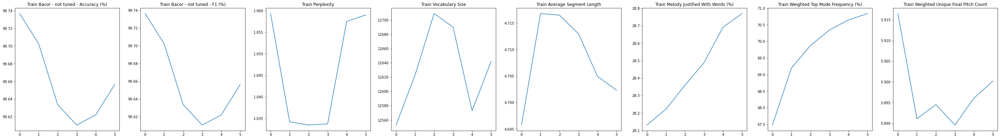

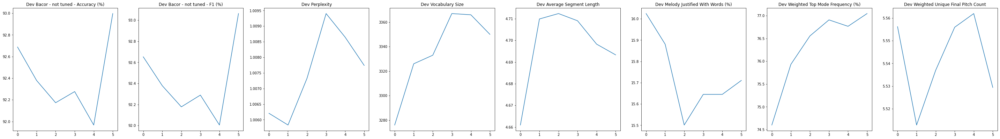

In [2]:
from src.utils.loader import prepare_dataset
from src.eval.pipelines import evaluation_trimmed_chants
from src.models.unigram_model import UnigramModelModes


train_proportion = 0.9
final_range_classifier = False
mode_priors_uniform = False

# Get Data
X, y = prepare_dataset()
X_train, y_train = X[:9706], y[:9706].tolist()
X_test, y_test = X[9706:], y[9706:].tolist()
# Init model
model = UnigramModelModes(min_size=3, max_size=5)
# Train and Fit model
model.train(X_train, y_train, iterations=5, init_mode = "gaussian", 
            train_proportion = train_proportion,
            final_range_classifier = final_range_classifier, 
            mode_priors_uniform = mode_priors_uniform)

train_segmentation, train_perplexity = model.predict_segments(X_train)
test_segmentation, test_perplexity = model.predict_segments(X_test)

------------------- Trimmed Evalution Pipeline -----------------

		 6 train chants are too short to not to be trimmed
		 2 test chants are too short to not to be trimmed


INFO:root:The SVC model was trained with 9700 training data and 9700 testing data.
INFO:root:From model approach - Selected features: 1000 (only 10% of them will be chosen)
INFO:root:From model approach Train data - First feature occurences: 1768 , Last feature occurences: 169
INFO:root:From model approach - reduced accuracy: 98.80%, reduced f1: 98.80%


------------------------------- Train Scores -------------------------------

		 bacor accuracy and f1
			 accuracy: 98.96%
			 f1: 98.96%

		 Perplexity
			 1.067251

		 Vocabulary Size
			 size: 12949 unique segments

		 Average Segment Length
			 avgerage: 4.71 tones in one segment

		 Melody Justified With Words
			 mjww: 17.38% of segments

		 Weighted Top Mode Frequency
			 wtmf: 70.14% of melodies

		 Weighted Unique Final Pitch Count
			 wufpc: 5.77 final pitches for a chant
------------- Modes Vocabulary Statistics -------------


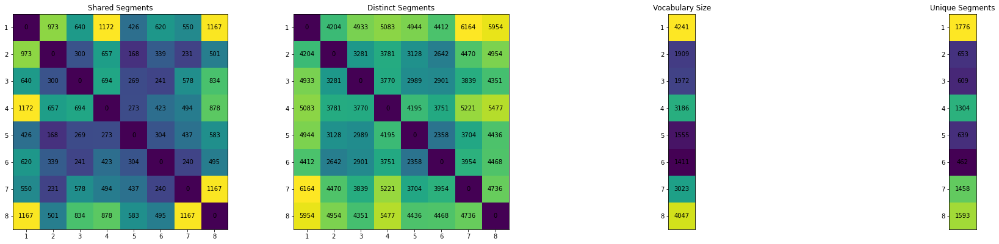

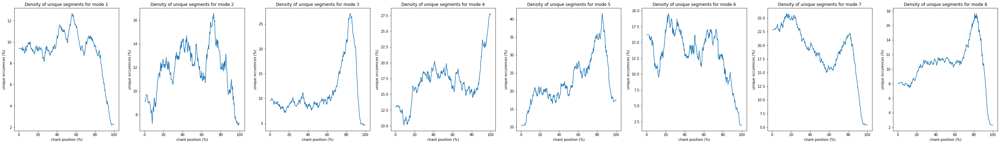

-------------------------------------------------------
--------------------------------------------------------------------------


INFO:root:The SVC model was trained with 9700 training data and 4157 testing data.
INFO:root:From model approach - Selected features: 1000 (only 10% of them will be chosen)
INFO:root:From model approach Train data - First feature occurences: 1768 , Last feature occurences: 169
INFO:root:From model approach - reduced accuracy: 92.09%, reduced f1: 92.09%


------------------------------- Test Scores -------------------------------

		 bacor accuracy and f1
			 accuracy: 92.83%
			 f1: 92.83%

		 Perplexity
			 1.003323

		 Vocabulary Size
			 size: 8603 unique segments

		 Average Segment Length
			 avgerage: 4.71 tones in one segment

		 Melody Justified With Phrases
			 mjww: -100.00% of segments

		 Melody Justified With Words
			 mjww: 15.46% of segments

		 Weighted Top Mode Frequency
			 wtmf: 70.62% of melodies

		 Weighted Unique Final Pitch Count
			 wufpc: 5.84 final pitches for a chant
------------- Modes Vocabulary Statistics -------------


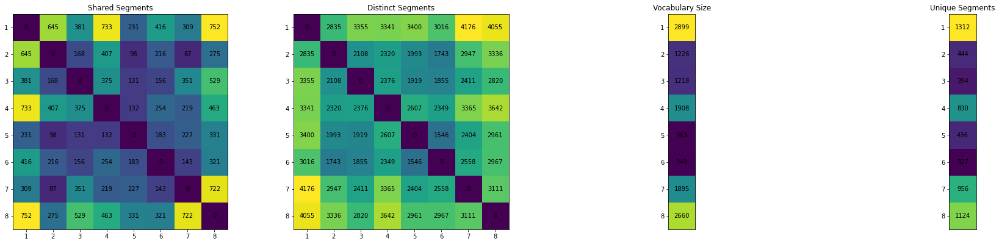

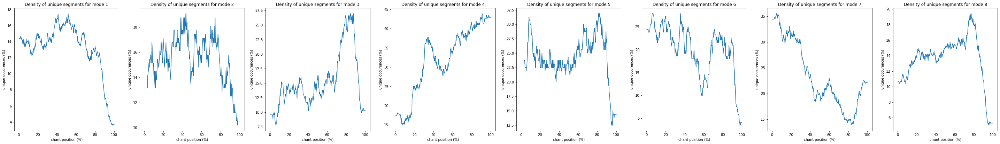

-------------------------------------------------------
--------------------------------------------------------------------------
Top selected melodies - from model: ['kjkhg', 'hgfgh', 'gfghg', 'fghgf', 'fedd', 'fghg', 'ghg', 'fedcd', 'ghgfg', 'hhgfg', 'efgfe', 'hgg', 'fgh', 'hgfgg', 'fgfed', 'ggllm', 'hgh', 'gfed', 'ggk', 'hhhg', 'fghh', 'fghhg', 'ggg', 'kkk', 'kjhgh', 'kjklk', 'gfghh', 'hghgf', 'ddhhg', 'fedee', 'hgefg', 'cdd', 'mlkjh', 'ffecd', 'ghgff', 'hgfed', 'gghgf', 'lkjh', 'fed', 'fefgf', 'eehgh', 'ghfed', 'fghhh', 'hkjhg', 'kkkjh', 'gfedd', 'hggk', 'ggghg', 'kljkh', 'efedd', 'hggll', 'hjhgg', 'gfefg', 'ggh', 'ghgfe', 'ghhgg', 'fgghg', 'hghjh', 'fedef', 'jklkh', 'hhhhh', 'edcdd', 'kjh', 'khkjh', 'khklk', 'ghkkk', 'jkhgh', 'ddcdf', 'hhg', 'ggfgh', 'jkjhg', 'hkhgg', 'kkkk', 'ghkk', 'hgfgf', 'gfggh', 'kkkkk', 'defgh', 'ffefg', 'hgfef', 'ddcfg', 'kkjhg', 'eddhh', 'lkjk', 'kkjkl', 'ghk', 'hgfee', 'defg', 'lll', 'gfee', 'kkjhk', 'efg', 'ddf', 'feddf', 'ghgfh', 'gfede', 'efggg', 'ff

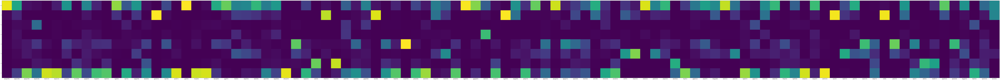



------------------------- Train + Test data charts ----------------------------
------------- Modes Vocabulary Statistics -------------


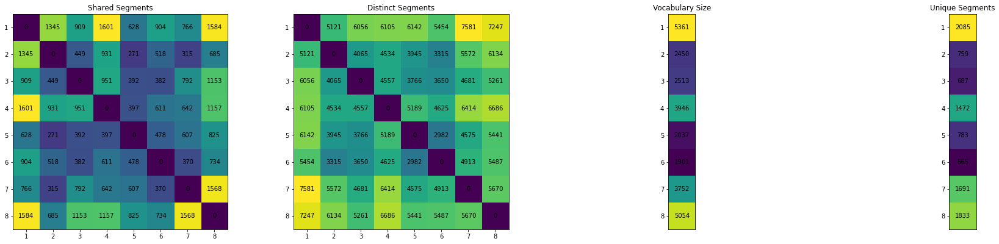

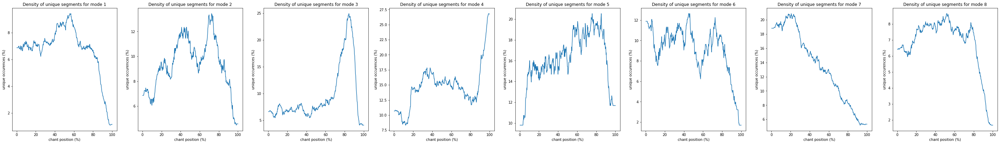

-------------------------------------------------------
------------------------------------------------------------------------


In [5]:
# Evaluate model left=1, right=0
bacor_model = evaluation_trimmed_chants(
    train_segmentation, y_train, test_segmentation, y_test, train_perplexity, test_perplexity,
    max_features_from_model = 100, include_additative = False, left_trim = 1, right_trim = 0)

------------------- Trimmed Evalution Pipeline -----------------

		 21 train chants are too short to not to be trimmed
		 7 test chants are too short to not to be trimmed


INFO:root:The SVC model was trained with 9685 training data and 9685 testing data.
INFO:root:From model approach - Selected features: 1000 (only 10% of them will be chosen)
INFO:root:From model approach Train data - First feature occurences: 1753 , Last feature occurences: 149
INFO:root:From model approach - reduced accuracy: 98.45%, reduced f1: 98.45%


------------------------------- Train Scores -------------------------------

		 bacor accuracy and f1
			 accuracy: 98.91%
			 f1: 98.90%

		 Perplexity
			 1.067251

		 Vocabulary Size
			 size: 12438 unique segments

		 Average Segment Length
			 avgerage: 4.72 tones in one segment

		 Melody Justified With Words
			 mjww: 15.24% of segments

		 Weighted Top Mode Frequency
			 wtmf: 70.08% of melodies

		 Weighted Unique Final Pitch Count
			 wufpc: 5.68 final pitches for a chant
------------- Modes Vocabulary Statistics -------------


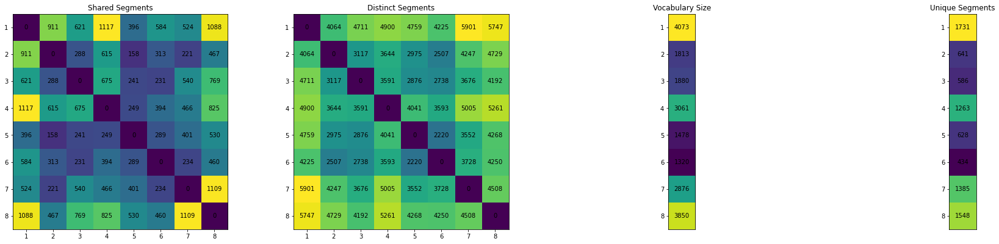

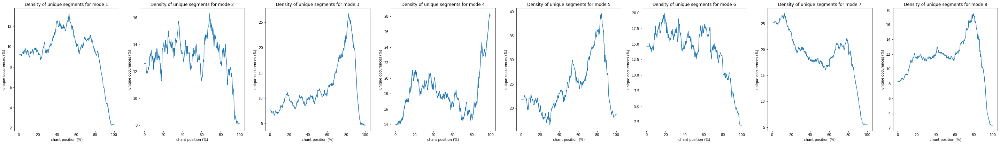

-------------------------------------------------------
--------------------------------------------------------------------------


INFO:root:The SVC model was trained with 9685 training data and 4152 testing data.
INFO:root:From model approach - Selected features: 1000 (only 10% of them will be chosen)
INFO:root:From model approach Train data - First feature occurences: 1753 , Last feature occurences: 149
INFO:root:From model approach - reduced accuracy: 90.94%, reduced f1: 90.94%


------------------------------- Test Scores -------------------------------

		 bacor accuracy and f1
			 accuracy: 92.05%
			 f1: 92.04%

		 Perplexity
			 1.003323

		 Vocabulary Size
			 size: 8235 unique segments

		 Average Segment Length
			 avgerage: 4.72 tones in one segment

		 Melody Justified With Phrases
			 mjww: -100.00% of segments

		 Melody Justified With Words
			 mjww: 14.26% of segments

		 Weighted Top Mode Frequency
			 wtmf: 70.64% of melodies

		 Weighted Unique Final Pitch Count
			 wufpc: 5.76 final pitches for a chant
------------- Modes Vocabulary Statistics -------------


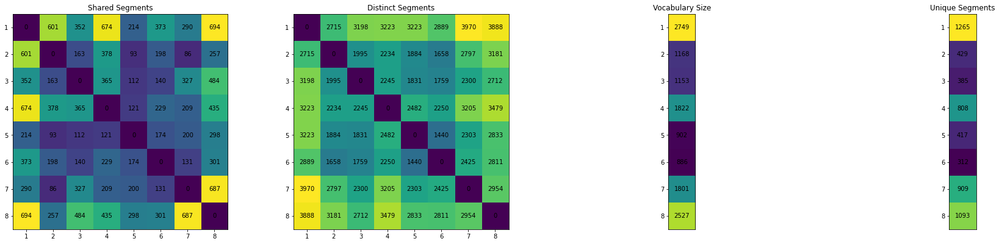

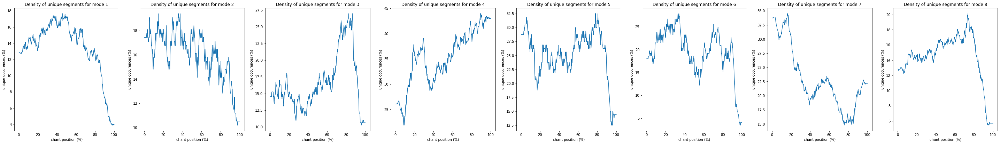

-------------------------------------------------------
--------------------------------------------------------------------------
Top selected melodies - from model: ['kjkhg', 'gfghg', 'fghgf', 'hgfgh', 'fedd', 'fghg', 'fedcd', 'ghg', 'ghgfg', 'hhgfg', 'efgfe', 'hgg', 'ggllm', 'hgfgg', 'fgh', 'ggk', 'gfed', 'hgh', 'fgfed', 'hhhg', 'kjhgh', 'ggg', 'ddhhg', 'kjklk', 'fedee', 'ffecd', 'fghhg', 'kkk', 'mlkjh', 'hgefg', 'ghgff', 'hgfed', 'fghh', 'hghgf', 'cdd', 'gghgf', 'lkjh', 'eehgh', 'fefgf', 'ghfed', 'hggk', 'fed', 'hkjhg', 'kljkh', 'hggll', 'efedd', 'gfedd', 'hjhgg', 'gfghh', 'ghgfe', 'fghhh', 'gfefg', 'jklkh', 'fgghg', 'fedef', 'ggghg', 'kkkjh', 'hghjh', 'ggh', 'edcdd', 'khklk', 'khkjh', 'jkjhg', 'hkhgg', 'kjh', 'hhhhh', 'hhg', 'ghhgg', 'hgfgf', 'ghkkk', 'ddcdf', 'eddhh', 'gfggh', 'ggfgh', 'kkkk', 'jkhgh', 'hgfef', 'ffefg', 'hgfee', 'defgh', 'ghkk', 'lkjk', 'kkkkk', 'gfee', 'kkjhg', 'ghk', 'feddf', 'ffgff', 'gfede', 'kkjhk', 'hghkh', 'defg', 'ddcfg', 'gfgg', 'efg', 'ghgfh', 'ghkhg', 

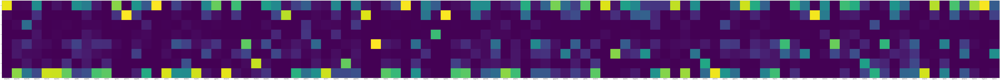



------------------------- Train + Test data charts ----------------------------
------------- Modes Vocabulary Statistics -------------


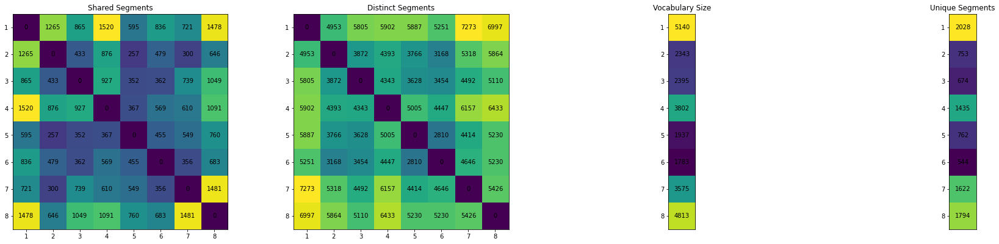

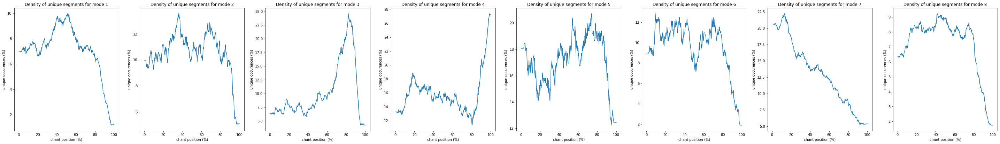

-------------------------------------------------------
------------------------------------------------------------------------


In [6]:
# Evaluate model left=2, right=0
bacor_model = evaluation_trimmed_chants(
    train_segmentation, y_train, test_segmentation, y_test, train_perplexity, test_perplexity,
    max_features_from_model = 100, include_additative = False, left_trim = 2, right_trim = 0)

------------------- Trimmed Evalution Pipeline -----------------

		 64 train chants are too short to not to be trimmed
		 16 test chants are too short to not to be trimmed


INFO:root:The SVC model was trained with 9642 training data and 9642 testing data.
INFO:root:From model approach - Selected features: 1000 (only 10% of them will be chosen)
INFO:root:From model approach Train data - First feature occurences: 1725 , Last feature occurences: 136
INFO:root:From model approach - reduced accuracy: 98.17%, reduced f1: 98.17%


------------------------------- Train Scores -------------------------------

		 bacor accuracy and f1
			 accuracy: 98.27%
			 f1: 98.26%

		 Perplexity
			 1.067251

		 Vocabulary Size
			 size: 11881 unique segments

		 Average Segment Length
			 avgerage: 4.72 tones in one segment

		 Melody Justified With Words
			 mjww: 14.03% of segments

		 Weighted Top Mode Frequency
			 wtmf: 70.46% of melodies

		 Weighted Unique Final Pitch Count
			 wufpc: 5.58 final pitches for a chant
------------- Modes Vocabulary Statistics -------------


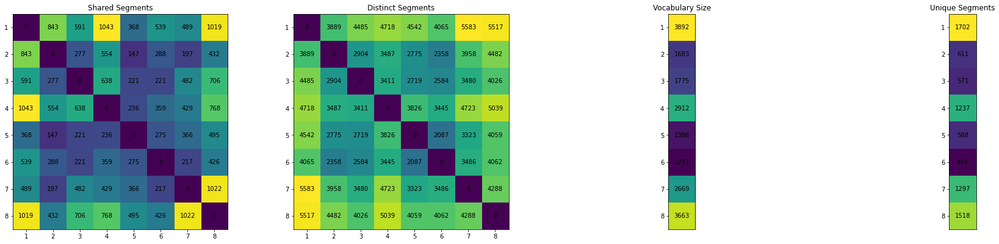

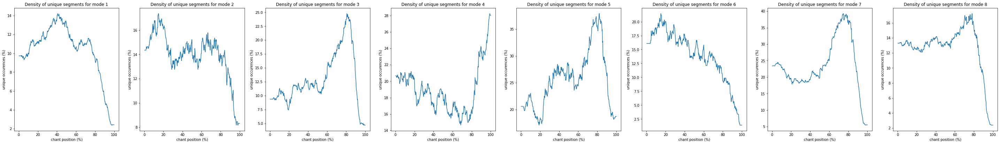

-------------------------------------------------------
--------------------------------------------------------------------------


INFO:root:The SVC model was trained with 9642 training data and 4143 testing data.
INFO:root:From model approach - Selected features: 1000 (only 10% of them will be chosen)
INFO:root:From model approach Train data - First feature occurences: 1725 , Last feature occurences: 136
INFO:root:From model approach - reduced accuracy: 90.63%, reduced f1: 90.62%


------------------------------- Test Scores -------------------------------

		 bacor accuracy and f1
			 accuracy: 91.87%
			 f1: 91.84%

		 Perplexity
			 1.003323

		 Vocabulary Size
			 size: 7774 unique segments

		 Average Segment Length
			 avgerage: 4.73 tones in one segment

		 Melody Justified With Phrases
			 mjww: -100.00% of segments

		 Melody Justified With Words
			 mjww: 13.29% of segments

		 Weighted Top Mode Frequency
			 wtmf: 70.86% of melodies

		 Weighted Unique Final Pitch Count
			 wufpc: 5.66 final pitches for a chant
------------- Modes Vocabulary Statistics -------------


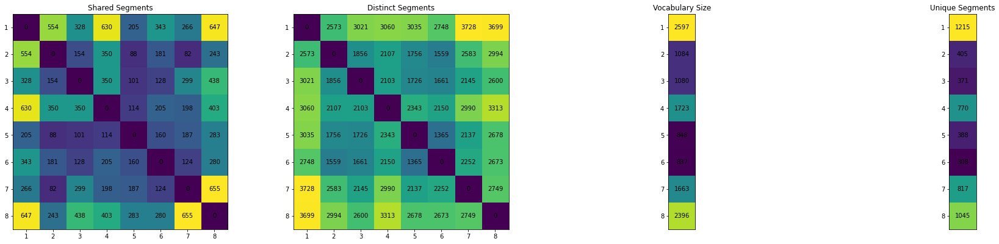

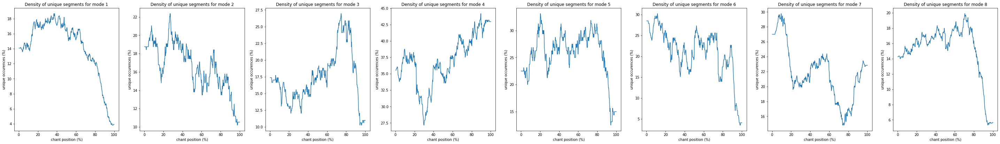

-------------------------------------------------------
--------------------------------------------------------------------------
Top selected melodies - from model: ['kjkhg', 'gfghg', 'fghgf', 'fedd', 'hgfgh', 'fghg', 'fedcd', 'hhgfg', 'ghg', 'efgfe', 'ggllm', 'ggk', 'hgg', 'gfed', 'hgfgg', 'fgh', 'fgfed', 'hgh', 'hhhg', 'ddhhg', 'kjhgh', 'kjklk', 'ffecd', 'mlkjh', 'fedee', 'hgfed', 'ghgff', 'eehgh', 'cdd', 'kkk', 'ggg', 'lkjh', 'fefgf', 'hghgf', 'fghhg', 'gghgf', 'hggk', 'fghh', 'hgefg', 'hggll', 'kljkh', 'hkjhg', 'efedd', 'fed', 'gfedd', 'ghfed', 'hjhgg', 'gfefg', 'fgghg', 'ghgfe', 'khklk', 'fedef', 'gfghh', 'fghhh', 'khkjh', 'jkjhg', 'edcdd', 'ggh', 'hghjh', 'kkkjh', 'hkhgg', 'jklkh', 'eddhh', 'ghkkk', 'ggghg', 'hgfgf', 'hgfee', 'kkkk', 'ddcdf', 'hhg', 'ffefg', 'klmlk', 'gfggh', 'jkhgh', 'defgh', 'ghkk', 'gfee', 'kkkkk', 'lkjk', 'hgfef', 'kjh', 'hhhhh', 'ggfgh', 'kkjhg', 'ffgff', 'ghk', 'gfede', 'feddf', 'ghhgg', 'defg', 'dhh', 'hghkh', 'hhggk', 'fgggk', 'kkjhk', 'efggg', 'hkkjh',

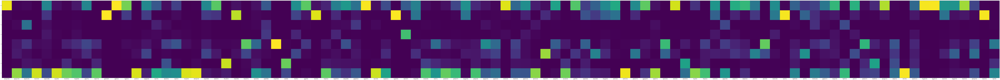



------------------------- Train + Test data charts ----------------------------
------------- Modes Vocabulary Statistics -------------


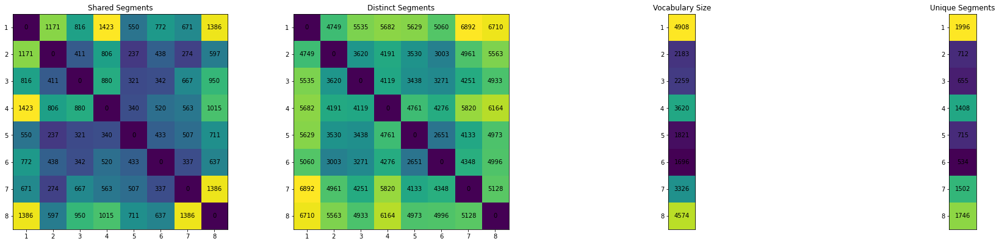

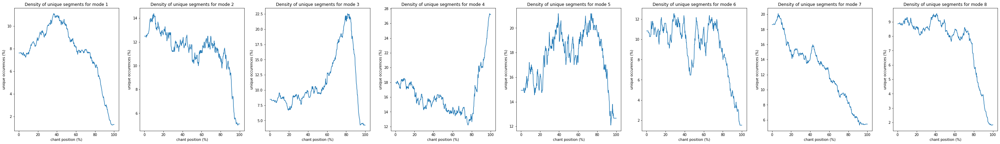

-------------------------------------------------------
------------------------------------------------------------------------


In [7]:
# Evaluate model left=3, right=0
bacor_model = evaluation_trimmed_chants(
    train_segmentation, y_train, test_segmentation, y_test, train_perplexity, test_perplexity,
    max_features_from_model = 100, include_additative = False, left_trim = 3, right_trim = 0)

------------------- Trimmed Evalution Pipeline -----------------

		 348 train chants are too short to not to be trimmed
		 143 test chants are too short to not to be trimmed


INFO:root:The SVC model was trained with 9358 training data and 9358 testing data.
INFO:root:From model approach - Selected features: 1000 (only 10% of them will be chosen)
INFO:root:From model approach Train data - First feature occurences: 1647 , Last feature occurences: 110
INFO:root:From model approach - reduced accuracy: 97.93%, reduced f1: 97.93%


------------------------------- Train Scores -------------------------------

		 bacor accuracy and f1
			 accuracy: 98.20%
			 f1: 98.20%

		 Perplexity
			 1.067251

		 Vocabulary Size
			 size: 10529 unique segments

		 Average Segment Length
			 avgerage: 4.72 tones in one segment

		 Melody Justified With Words
			 mjww: 11.14% of segments

		 Weighted Top Mode Frequency
			 wtmf: 72.07% of melodies

		 Weighted Unique Final Pitch Count
			 wufpc: 5.40 final pitches for a chant
------------- Modes Vocabulary Statistics -------------


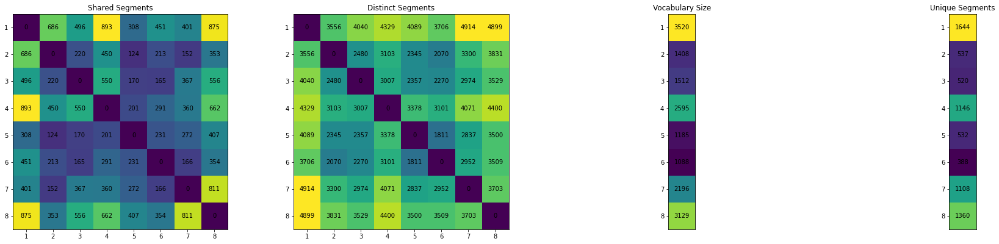

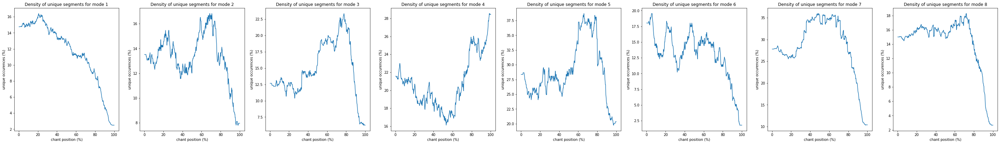

-------------------------------------------------------
--------------------------------------------------------------------------


INFO:root:The SVC model was trained with 9358 training data and 4016 testing data.
INFO:root:From model approach - Selected features: 1000 (only 10% of them will be chosen)
INFO:root:From model approach Train data - First feature occurences: 1647 , Last feature occurences: 110
INFO:root:From model approach - reduced accuracy: 90.91%, reduced f1: 90.89%


------------------------------- Test Scores -------------------------------

		 bacor accuracy and f1
			 accuracy: 91.63%
			 f1: 91.61%

		 Perplexity
			 1.003323

		 Vocabulary Size
			 size: 6825 unique segments

		 Average Segment Length
			 avgerage: 4.72 tones in one segment

		 Melody Justified With Phrases
			 mjww: -100.00% of segments

		 Melody Justified With Words
			 mjww: 11.18% of segments

		 Weighted Top Mode Frequency
			 wtmf: 72.67% of melodies

		 Weighted Unique Final Pitch Count
			 wufpc: 5.51 final pitches for a chant
------------- Modes Vocabulary Statistics -------------


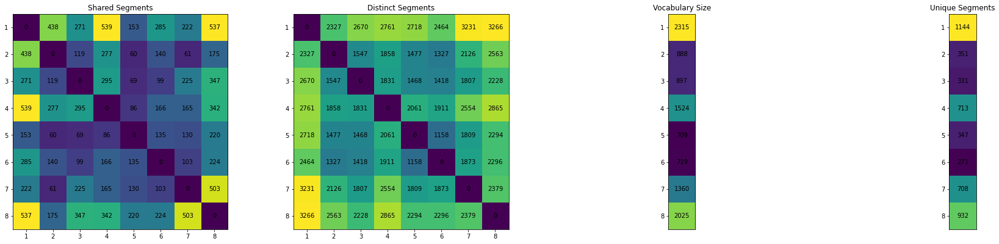

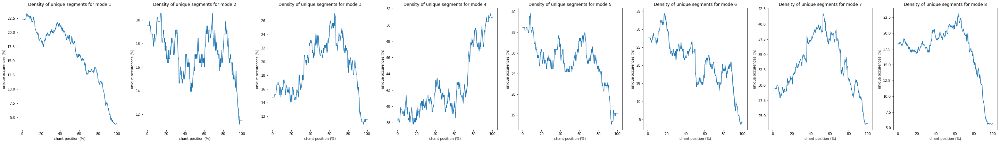

-------------------------------------------------------
--------------------------------------------------------------------------
Top selected melodies - from model: ['kjkhg', 'gfghg', 'fghgf', 'fedd', 'fghg', 'fedcd', 'hgfgh', 'hhgfg', 'ggllm', 'efgfe', 'ghg', 'ggk', 'gfed', 'ghgfg', 'hhhg', 'ddhhg', 'hgg', 'ffecd', 'fgfed', 'mlkjh', 'hgfgg', 'hgh', 'eehgh', 'kjklk', 'fgh', 'hgfed', 'fedee', 'cdd', 'lkjh', 'kjhgh', 'hggll', 'fefgf', 'hggk', 'kljkh', 'fghh', 'ggg', 'gghgf', 'gfedd', 'ghgff', 'efedd', 'fed', 'kkk', 'hghgf', 'fghhg', 'khkjh', 'khklk', 'fgghg', 'hjhgg', 'eddhh', 'hgefg', 'ghfed', 'fedef', 'jkjhg', 'ghgfe', 'edcdd', 'fghhh', 'hgfee', 'gfefg', 'hghjh', 'hkjhg', 'ghkkk', 'kkkjh', 'hkhgg', 'hhg', 'lkjk', 'gfee', 'ggghg', 'defgh', 'jkhgh', 'ffefg', 'ggh', 'hgfgf', 'ddcdf', 'ghkk', 'dhh', 'ghhgg', 'gfggh', 'gfede', 'hhhhh', 'ffgff', 'kkkk', 'fgggk', 'jklkh', 'ghk', 'feekk', 'klmlk', 'hgfef', 'hhggk', 'mlkjk', 'kjh', 'feddf', 'ggfgh', 'defg', 'fghgh', 'kkjhg', 'kge', 'dcdd', 'j

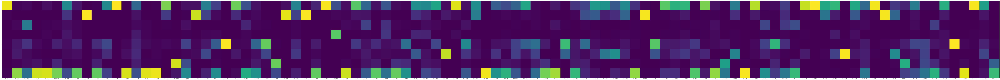



------------------------- Train + Test data charts ----------------------------
------------- Modes Vocabulary Statistics -------------


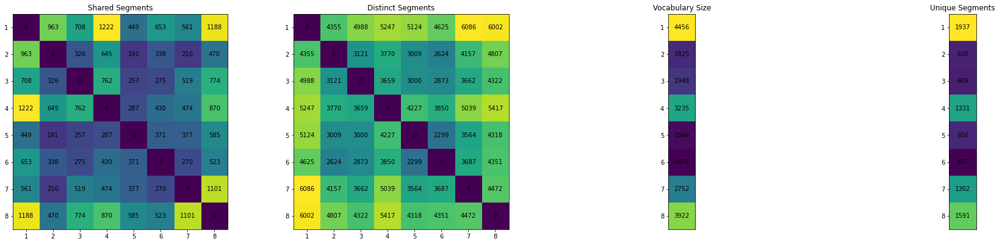

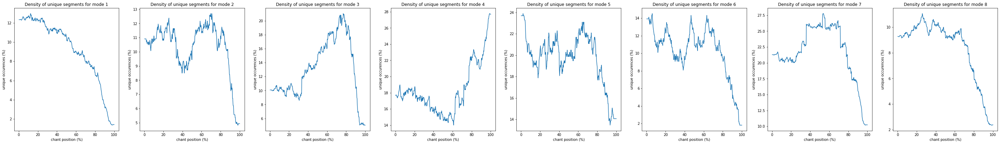

-------------------------------------------------------
------------------------------------------------------------------------


In [8]:
# Evaluate model left=5, right=0
bacor_model = evaluation_trimmed_chants(
    train_segmentation, y_train, test_segmentation, y_test, train_perplexity, test_perplexity,
    max_features_from_model = 100, include_additative = False, left_trim = 5, right_trim = 0)

------------------- Trimmed Evalution Pipeline -----------------

		 4644 train chants are too short to not to be trimmed
		 2031 test chants are too short to not to be trimmed


INFO:root:The SVC model was trained with 5062 training data and 5062 testing data.
INFO:root:From model approach - Selected features: 1000 (only 10% of them will be chosen)
INFO:root:From model approach Train data - First feature occurences: 885 , Last feature occurences: 51
INFO:root:From model approach - reduced accuracy: 98.42%, reduced f1: 98.42%


------------------------------- Train Scores -------------------------------

		 bacor accuracy and f1
			 accuracy: 98.34%
			 f1: 98.33%

		 Perplexity
			 1.067251

		 Vocabulary Size
			 size: 7070 unique segments

		 Average Segment Length
			 avgerage: 4.72 tones in one segment

		 Melody Justified With Words
			 mjww: 9.56% of segments

		 Weighted Top Mode Frequency
			 wtmf: 75.00% of melodies

		 Weighted Unique Final Pitch Count
			 wufpc: 5.53 final pitches for a chant
------------- Modes Vocabulary Statistics -------------


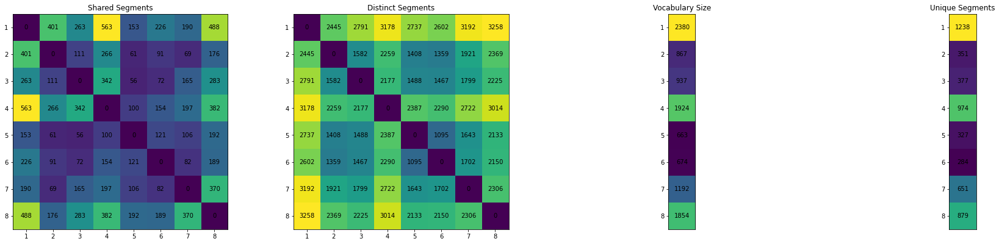

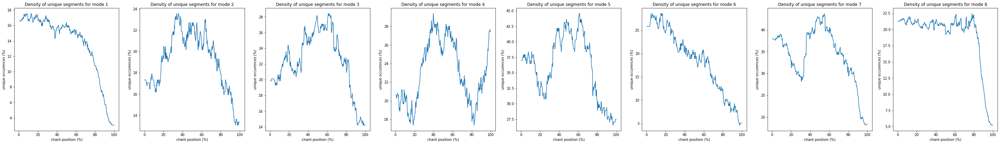

-------------------------------------------------------
--------------------------------------------------------------------------


INFO:root:The SVC model was trained with 5062 training data and 2128 testing data.
INFO:root:From model approach - Selected features: 1000 (only 10% of them will be chosen)
INFO:root:From model approach Train data - First feature occurences: 885 , Last feature occurences: 51
INFO:root:From model approach - reduced accuracy: 89.05%, reduced f1: 88.99%


------------------------------- Test Scores -------------------------------

		 bacor accuracy and f1
			 accuracy: 90.08%
			 f1: 90.00%

		 Perplexity
			 1.003323

		 Vocabulary Size
			 size: 4451 unique segments

		 Average Segment Length
			 avgerage: 4.72 tones in one segment

		 Melody Justified With Phrases
			 mjww: -100.00% of segments

		 Melody Justified With Words
			 mjww: 9.64% of segments

		 Weighted Top Mode Frequency
			 wtmf: 75.78% of melodies

		 Weighted Unique Final Pitch Count
			 wufpc: 5.73 final pitches for a chant
------------- Modes Vocabulary Statistics -------------


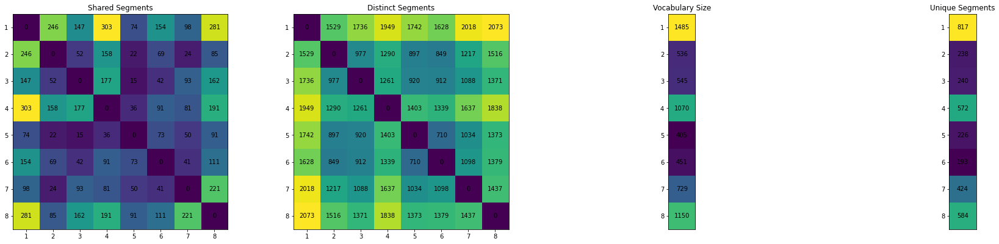

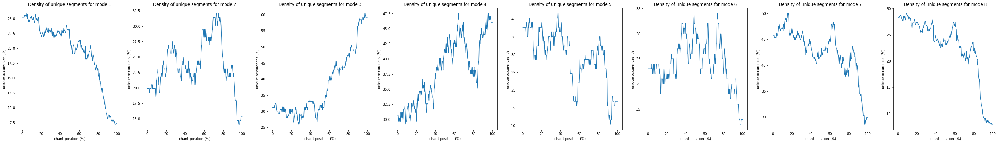

-------------------------------------------------------
--------------------------------------------------------------------------
Top selected melodies - from model: ['kjkhg', 'gfghg', 'fghgf', 'fghg', 'hhgfg', 'fedd', 'fedcd', 'gfed', 'hgfgh', 'ghg', 'hgfed', 'hhhg', 'efgfe', 'fedee', 'mlkjh', 'ggk', 'ddhhg', 'ffecd', 'fgfed', 'fgh', 'cdd', 'hgfgg', 'ggllm', 'ghgfg', 'eehgh', 'hgh', 'hgg', 'fed', 'lkjh', 'fghh', 'fefgf', 'kljkh', 'hggk', 'gfedd', 'kjhgh', 'gghgf', 'ghfed', 'fgghg', 'efedd', 'edcdd', 'ggg', 'hghgf', 'ghgfe', 'jkjhg', 'fghhh', 'hgfee', 'gfee', 'eddhh', 'hghjh', 'hggll', 'ghgff', 'gfede', 'khkjh', 'fghhg', 'hgefg', 'kkk', 'ddcdf', 'ggghg', 'fgggk', 'kkkjh', 'hhg', 'fedef', 'jkhgh', 'dhh', 'defgh', 'gfggh', 'gfefg', 'ffefg', 'kge', 'fghgh', 'ghkkk', 'khklk', 'ghgfd', 'kjklk', 'ggh', 'gfghh', 'hkhgg', 'jhgfe', 'dcdfe', 'hhhhh', 'jhgh', 'dcdd', 'hgfef', 'ghhgg', 'hgfgf', 'efed', 'hjhgg', 'khkhg', 'feekk', 'defg', 'ffgff', 'gfedf', 'ghkk', 'ggfgh', 'ghk', 'efggg', 'hkkjh', 

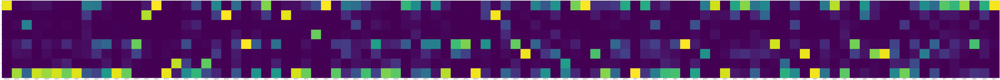



------------------------- Train + Test data charts ----------------------------
------------- Modes Vocabulary Statistics -------------


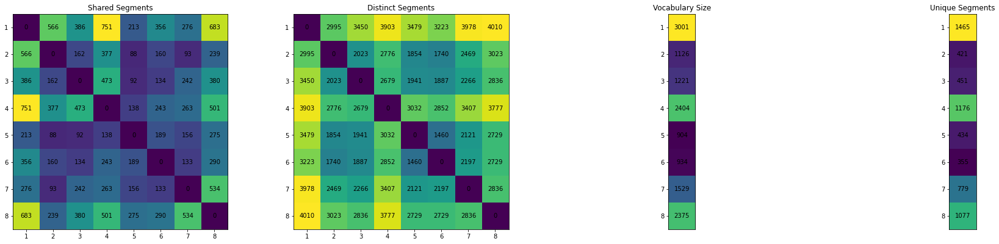

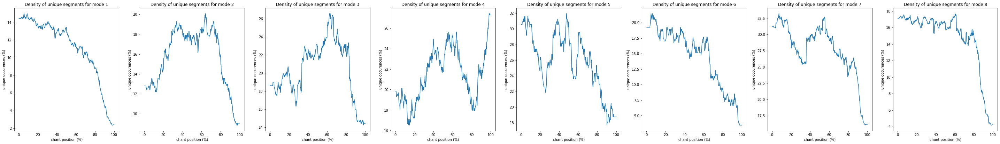

-------------------------------------------------------
------------------------------------------------------------------------


In [9]:
# Evaluate model left=10, right=0
bacor_model = evaluation_trimmed_chants(
    train_segmentation, y_train, test_segmentation, y_test, train_perplexity, test_perplexity,
    max_features_from_model = 100, include_additative = False, left_trim = 10, right_trim = 0)

------------------- Trimmed Evalution Pipeline -----------------

		 6 train chants are too short to not to be trimmed
		 2 test chants are too short to not to be trimmed


INFO:root:The SVC model was trained with 9700 training data and 9700 testing data.
INFO:root:From model approach - Selected features: 1000 (only 10% of them will be chosen)
INFO:root:From model approach Train data - First feature occurences: 1074 , Last feature occurences: 166
INFO:root:From model approach - reduced accuracy: 98.09%, reduced f1: 98.09%


------------------------------- Train Scores -------------------------------

		 bacor accuracy and f1
			 accuracy: 98.37%
			 f1: 98.37%

		 Perplexity
			 1.067251

		 Vocabulary Size
			 size: 13142 unique segments

		 Average Segment Length
			 avgerage: 4.71 tones in one segment

		 Melody Justified With Words
			 mjww: 18.33% of segments

		 Weighted Top Mode Frequency
			 wtmf: 69.39% of melodies

		 Weighted Unique Final Pitch Count
			 wufpc: 5.82 final pitches for a chant
------------- Modes Vocabulary Statistics -------------


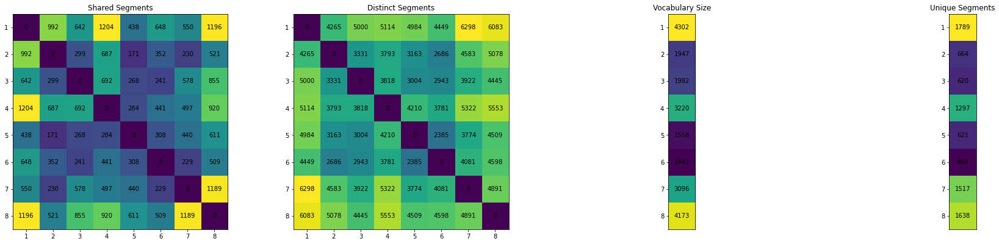

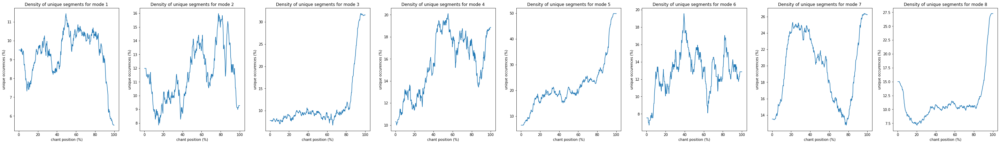

-------------------------------------------------------
--------------------------------------------------------------------------


INFO:root:The SVC model was trained with 9700 training data and 4157 testing data.
INFO:root:From model approach - Selected features: 1000 (only 10% of them will be chosen)
INFO:root:From model approach Train data - First feature occurences: 1074 , Last feature occurences: 166
INFO:root:From model approach - reduced accuracy: 90.64%, reduced f1: 90.64%


------------------------------- Test Scores -------------------------------

		 bacor accuracy and f1
			 accuracy: 92.23%
			 f1: 92.23%

		 Perplexity
			 1.003323

		 Vocabulary Size
			 size: 8762 unique segments

		 Average Segment Length
			 avgerage: 4.71 tones in one segment

		 Melody Justified With Phrases
			 mjww: -100.00% of segments

		 Melody Justified With Words
			 mjww: 15.39% of segments

		 Weighted Top Mode Frequency
			 wtmf: 69.89% of melodies

		 Weighted Unique Final Pitch Count
			 wufpc: 5.87 final pitches for a chant
------------- Modes Vocabulary Statistics -------------


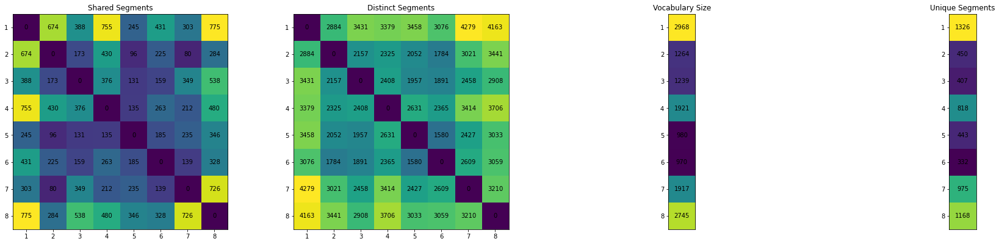

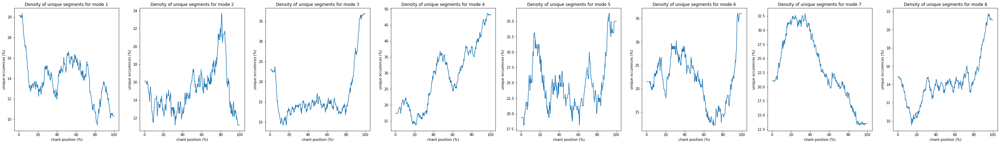

-------------------------------------------------------
--------------------------------------------------------------------------
Top selected melodies - from model: ['hgfgh', 'ghgfg', 'ghg', 'fedcd', 'hhgfg', 'efgfe', 'fedd', 'ggk', 'fghgf', 'fgh', 'gfghg', 'ggg', 'ggllm', 'fgfed', 'hgh', 'hhhg', 'kkk', 'fghg', 'hgg', 'hgfgg', 'kjklk', 'fghhg', 'hghgf', 'fghh', 'gfghh', 'kjhgh', 'ddhhg', 'kjkhg', 'hgefg', 'ddcfg', 'gghgf', 'fedee', 'ghgff', 'kkkjh', 'gfed', 'eehgh', 'fefgf', 'ghfed', 'fed', 'ggh', 'hkjhg', 'fghhh', 'hggk', 'ggghg', 'ddcdf', 'gfefg', 'hggll', 'ghkk', 'ghkkk', 'fedef', 'kkjhg', 'hgfed', 'hghjh', 'ghgfe', 'hjhgg', 'jklkh', 'fgghg', 'efedd', 'gfedd', 'cdd', 'hhhhh', 'ggjkl', 'ljlml', 'kkkk', 'defg', 'defgg', 'kjh', 'ggfgh', 'hhg', 'kkjkl', 'kkkkk', 'ghk', 'edcdd', 'ddf', 'hgfgf', 'defgh', 'ffefg', 'ghhgg', 'hgfef', 'klkkj', 'efg', 'jklml', 'eddhh', 'lll', 'kkjhk', 'dcdfe', 'ddd', 'dcdff', 'dhh', 'feddf', 'ffgff', 'ghgfh', 'ggggh', 'efggg', 'jkhgh', 'hghkh', 'gfggh', 'gfe

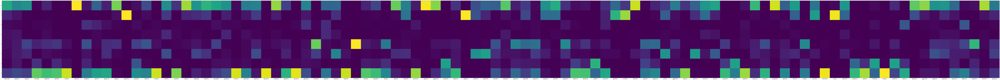



------------------------- Train + Test data charts ----------------------------
------------- Modes Vocabulary Statistics -------------


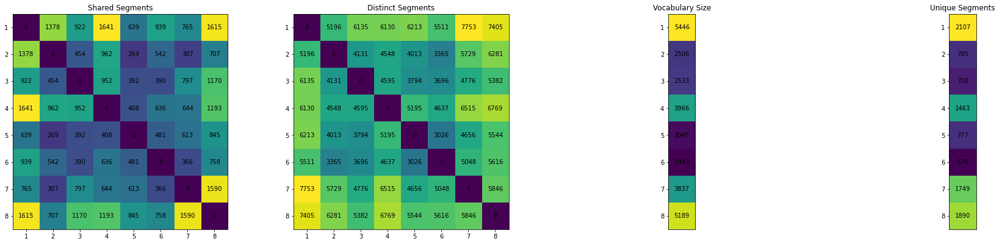

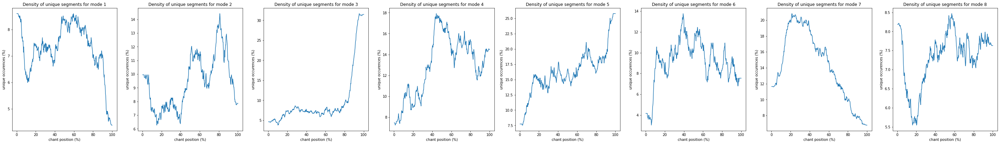

-------------------------------------------------------
------------------------------------------------------------------------


In [10]:
# Evaluate model left=0, right=1
bacor_model = evaluation_trimmed_chants(
    train_segmentation, y_train, test_segmentation, y_test, train_perplexity, test_perplexity,
    max_features_from_model = 100, include_additative = False, left_trim = 0, right_trim = 1)

------------------- Trimmed Evalution Pipeline -----------------

		 21 train chants are too short to not to be trimmed
		 7 test chants are too short to not to be trimmed


INFO:root:The SVC model was trained with 9685 training data and 9685 testing data.
INFO:root:From model approach - Selected features: 1000 (only 10% of them will be chosen)
INFO:root:From model approach Train data - First feature occurences: 992 , Last feature occurences: 150
INFO:root:From model approach - reduced accuracy: 96.49%, reduced f1: 96.49%


------------------------------- Train Scores -------------------------------

		 bacor accuracy and f1
			 accuracy: 97.91%
			 f1: 97.91%

		 Perplexity
			 1.067251

		 Vocabulary Size
			 size: 12716 unique segments

		 Average Segment Length
			 avgerage: 4.72 tones in one segment

		 Melody Justified With Words
			 mjww: 15.63% of segments

		 Weighted Top Mode Frequency
			 wtmf: 68.16% of melodies

		 Weighted Unique Final Pitch Count
			 wufpc: 5.72 final pitches for a chant
------------- Modes Vocabulary Statistics -------------


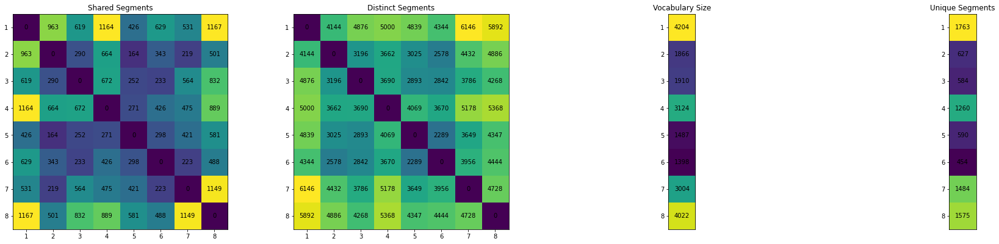

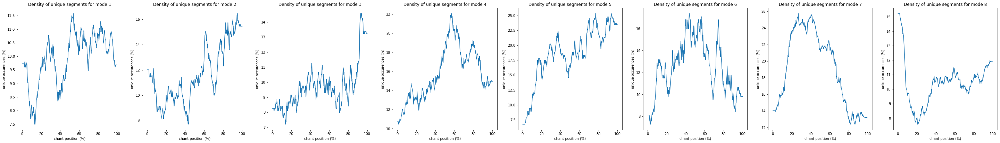

-------------------------------------------------------
--------------------------------------------------------------------------


INFO:root:The SVC model was trained with 9685 training data and 4152 testing data.
INFO:root:From model approach - Selected features: 1000 (only 10% of them will be chosen)
INFO:root:From model approach Train data - First feature occurences: 992 , Last feature occurences: 150
INFO:root:From model approach - reduced accuracy: 88.46%, reduced f1: 88.41%


------------------------------- Test Scores -------------------------------

		 bacor accuracy and f1
			 accuracy: 89.91%
			 f1: 89.84%

		 Perplexity
			 1.003323

		 Vocabulary Size
			 size: 8462 unique segments

		 Average Segment Length
			 avgerage: 4.72 tones in one segment

		 Melody Justified With Phrases
			 mjww: -100.00% of segments

		 Melody Justified With Words
			 mjww: 14.56% of segments

		 Weighted Top Mode Frequency
			 wtmf: 68.90% of melodies

		 Weighted Unique Final Pitch Count
			 wufpc: 5.79 final pitches for a chant
------------- Modes Vocabulary Statistics -------------


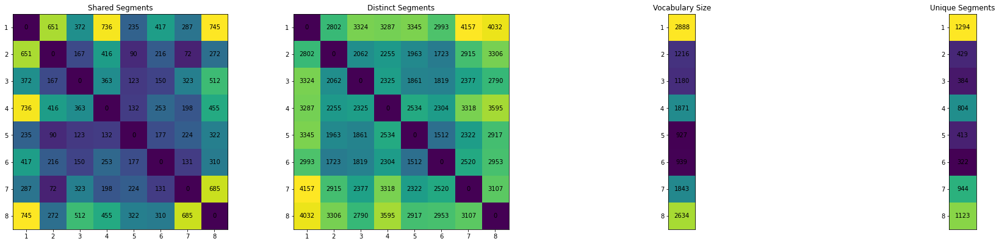

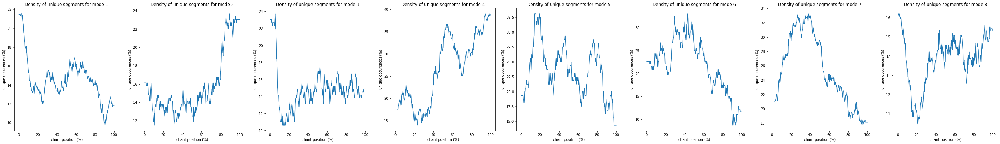

-------------------------------------------------------
--------------------------------------------------------------------------
Top selected melodies - from model: ['hgfgh', 'ghgfg', 'ghg', 'efgfe', 'fedd', 'fedcd', 'fghgf', 'ggg', 'fgh', 'fgfed', 'gfghg', 'hgg', 'hgfgg', 'hhgfg', 'fghg', 'fghhg', 'fghh', 'kjklk', 'hghgf', 'hgh', 'gfghh', 'kjhgh', 'ddcfg', 'gghgf', 'hgefg', 'kkk', 'fedee', 'ghgff', 'ghfed', 'fefgf', 'fed', 'hkjhg', 'ggh', 'fghhh', 'ggghg', 'kjkhg', 'gfed', 'ddcdf', 'kkkjh', 'gfefg', 'kkjhg', 'ghgfe', 'fedef', 'hgfed', 'hjhgg', 'ghkk', 'jklkh', 'efedd', 'gfedd', 'ljlml', 'cdd', 'ggjkl', 'defgg', 'fgghg', 'defg', 'klmlk', 'kkjkl', 'ggfgh', 'kjh', 'ggk', 'edcdd', 'ghkkk', 'hghjh', 'hgfgf', 'hhhg', 'jklml', 'klkkj', 'ghhgg', 'dcdfe', 'defgh', 'kkkkk', 'kkjhk', 'ddd', 'efg', 'hgfef', 'ghk', 'hhhhh', 'ffgff', 'ffefg', 'ggggh', 'ghgfh', 'efggg', 'gfede', 'dcdff', 'kkkk', 'hghkh', 'jkhgh', 'hkkjh', 'lll', 'ddf', 'gfhkk', 'ghjhg', 'ghkhg', 'ggkhg', 'hkhgg', 'gfggh', 'ffede',

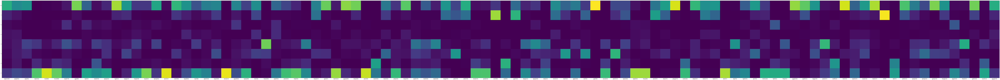



------------------------- Train + Test data charts ----------------------------
------------- Modes Vocabulary Statistics -------------


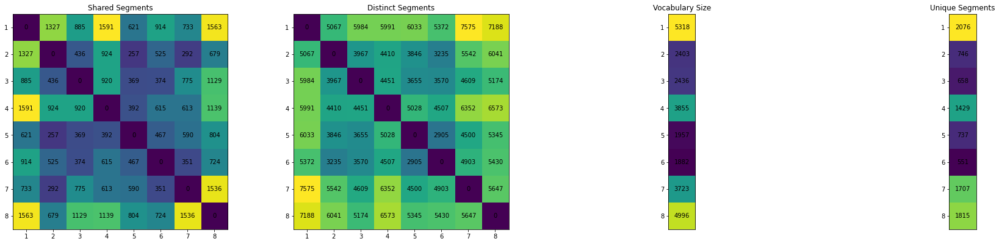

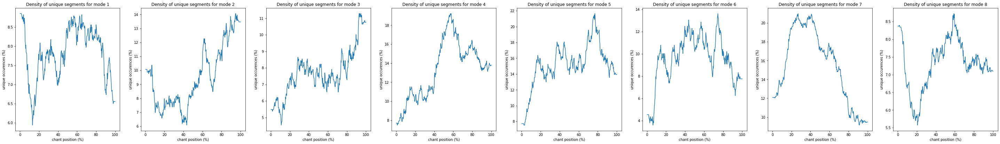

-------------------------------------------------------
------------------------------------------------------------------------


In [11]:
# Evaluate model left=0, right=2
bacor_model = evaluation_trimmed_chants(
    train_segmentation, y_train, test_segmentation, y_test, train_perplexity, test_perplexity,
    max_features_from_model = 100, include_additative = False, left_trim = 0, right_trim = 2)

------------------- Trimmed Evalution Pipeline -----------------

		 64 train chants are too short to not to be trimmed
		 16 test chants are too short to not to be trimmed


INFO:root:The SVC model was trained with 9642 training data and 9642 testing data.
INFO:root:From model approach - Selected features: 1000 (only 10% of them will be chosen)
INFO:root:From model approach Train data - First feature occurences: 839 , Last feature occurences: 136
INFO:root:From model approach - reduced accuracy: 95.77%, reduced f1: 95.76%


------------------------------- Train Scores -------------------------------

		 bacor accuracy and f1
			 accuracy: 97.20%
			 f1: 97.19%

		 Perplexity
			 1.067251

		 Vocabulary Size
			 size: 12126 unique segments

		 Average Segment Length
			 avgerage: 4.72 tones in one segment

		 Melody Justified With Words
			 mjww: 14.40% of segments

		 Weighted Top Mode Frequency
			 wtmf: 68.35% of melodies

		 Weighted Unique Final Pitch Count
			 wufpc: 5.60 final pitches for a chant
------------- Modes Vocabulary Statistics -------------


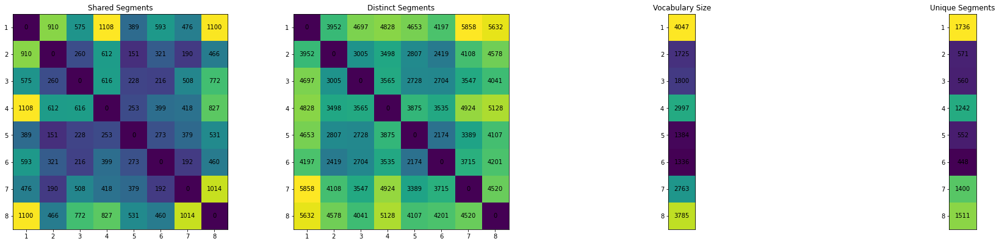

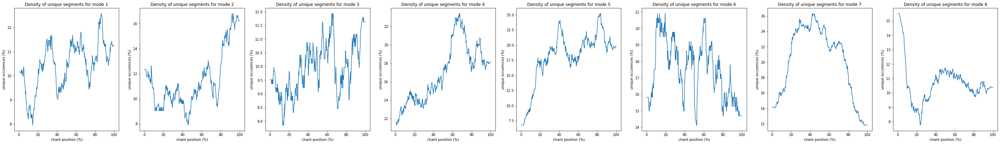

-------------------------------------------------------
--------------------------------------------------------------------------


INFO:root:The SVC model was trained with 9642 training data and 4143 testing data.
INFO:root:From model approach - Selected features: 1000 (only 10% of them will be chosen)
INFO:root:From model approach Train data - First feature occurences: 839 , Last feature occurences: 136
INFO:root:From model approach - reduced accuracy: 87.33%, reduced f1: 87.26%


------------------------------- Test Scores -------------------------------

		 bacor accuracy and f1
			 accuracy: 88.70%
			 f1: 88.61%

		 Perplexity
			 1.003323

		 Vocabulary Size
			 size: 8065 unique segments

		 Average Segment Length
			 avgerage: 4.72 tones in one segment

		 Melody Justified With Phrases
			 mjww: -100.00% of segments

		 Melody Justified With Words
			 mjww: 13.43% of segments

		 Weighted Top Mode Frequency
			 wtmf: 69.12% of melodies

		 Weighted Unique Final Pitch Count
			 wufpc: 5.67 final pitches for a chant
------------- Modes Vocabulary Statistics -------------


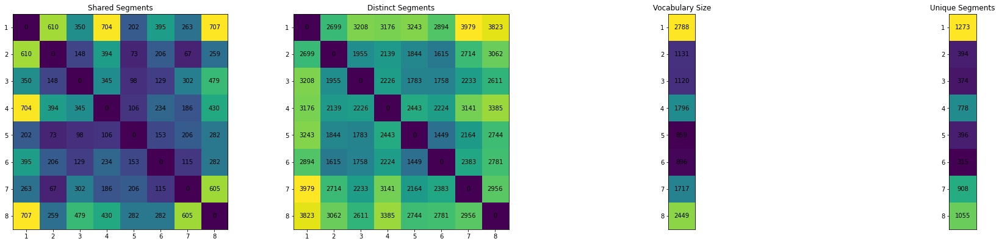

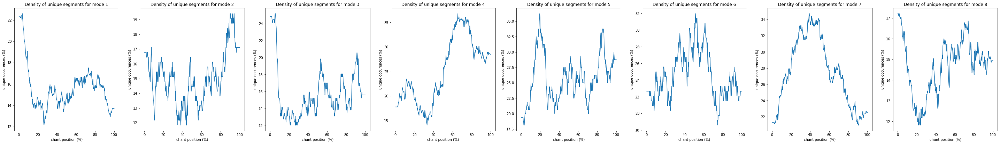

-------------------------------------------------------
--------------------------------------------------------------------------
Top selected melodies - from model: ['hgfgh', 'ghgfg', 'ghg', 'fedcd', 'ggg', 'fghgf', 'efgfe', 'fedd', 'fgh', 'fgfed', 'gfghg', 'fghg', 'hghgf', 'hgg', 'fghhg', 'hgh', 'kjhgh', 'kjklk', 'ddcfg', 'hgfgg', 'hhgfg', 'gfghh', 'fghh', 'gghgf', 'kkk', 'fedee', 'hgefg', 'ghgff', 'ghfed', 'hkjhg', 'fed', 'ggh', 'kkjhg', 'kkkjh', 'ddcdf', 'gfefg', 'ggjkl', 'ljlml', 'kjkhg', 'gfed', 'hgfed', 'fghhh', 'fefgf', 'ghkk', 'fedef', 'ggghg', 'defgg', 'klmlk', 'kkjkl', 'cdd', 'hjhgg', 'ghgfe', 'ggfgh', 'fgghg', 'defg', 'kjh', 'jklkh', 'jklml', 'klkkj', 'hgfgf', 'ghkkk', 'ggk', 'gfedd', 'hhhg', 'efedd', 'kkkkk', 'ghhgg', 'edcdd', 'efg', 'kkjhk', 'hgfef', 'ghk', 'ffgff', 'ddd', 'ggggh', 'ghgfh', 'ffefg', 'efggg', 'dcdff', 'kkkk', 'ggkhg', 'lll', 'hkkjh', 'ddf', 'ghkhg', 'hhhhh', 'gfhkk', 'gfede', 'jkhgh', 'ffede', 'ggfhk', 'hghkh', 'dcdfe', 'hkhgg', 'ggggg', 'ghjhg', 'gfggh',

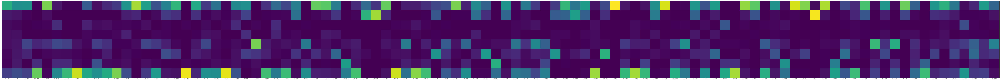



------------------------- Train + Test data charts ----------------------------
------------- Modes Vocabulary Statistics -------------


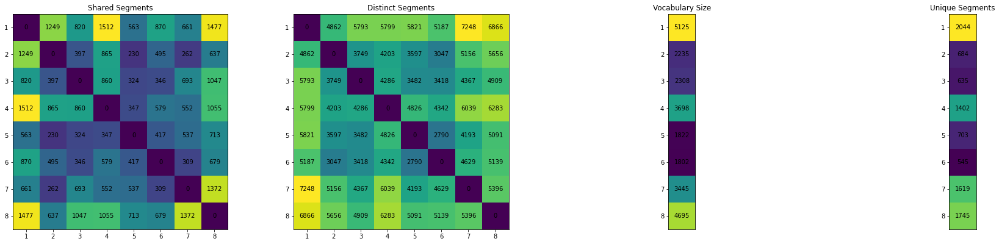

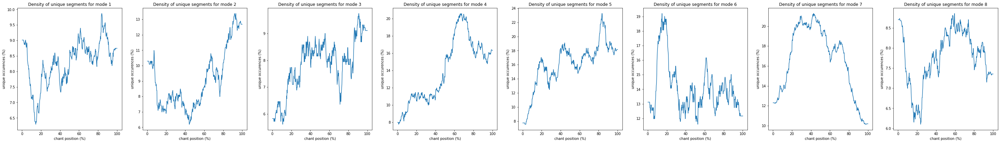

-------------------------------------------------------
------------------------------------------------------------------------


In [12]:
# Evaluate model left=0, right=3
bacor_model = evaluation_trimmed_chants(
    train_segmentation, y_train, test_segmentation, y_test, train_perplexity, test_perplexity,
    max_features_from_model = 100, include_additative = False, left_trim = 0, right_trim = 3)

------------------- Trimmed Evalution Pipeline -----------------

		 348 train chants are too short to not to be trimmed
		 143 test chants are too short to not to be trimmed


INFO:root:The SVC model was trained with 9358 training data and 9358 testing data.
INFO:root:From model approach - Selected features: 1000 (only 10% of them will be chosen)
INFO:root:From model approach Train data - First feature occurences: 690 , Last feature occurences: 106
INFO:root:From model approach - reduced accuracy: 94.56%, reduced f1: 94.54%


------------------------------- Train Scores -------------------------------

		 bacor accuracy and f1
			 accuracy: 96.77%
			 f1: 96.76%

		 Perplexity
			 1.067251

		 Vocabulary Size
			 size: 10757 unique segments

		 Average Segment Length
			 avgerage: 4.72 tones in one segment

		 Melody Justified With Words
			 mjww: 11.37% of segments

		 Weighted Top Mode Frequency
			 wtmf: 69.99% of melodies

		 Weighted Unique Final Pitch Count
			 wufpc: 5.39 final pitches for a chant
------------- Modes Vocabulary Statistics -------------


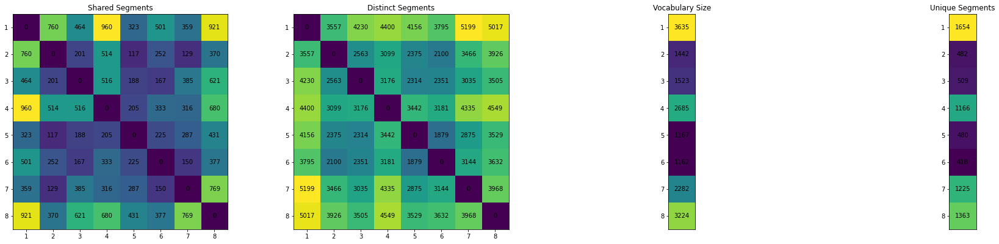

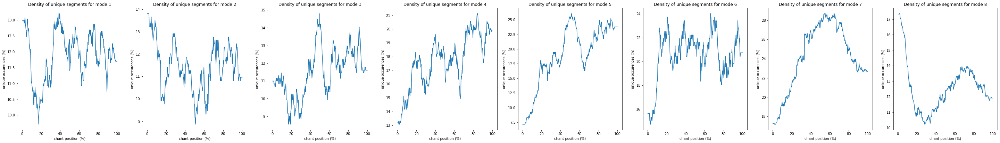

-------------------------------------------------------
--------------------------------------------------------------------------


INFO:root:The SVC model was trained with 9358 training data and 4016 testing data.
INFO:root:From model approach - Selected features: 1000 (only 10% of them will be chosen)
INFO:root:From model approach Train data - First feature occurences: 690 , Last feature occurences: 106
INFO:root:From model approach - reduced accuracy: 85.96%, reduced f1: 85.84%


------------------------------- Test Scores -------------------------------

		 bacor accuracy and f1
			 accuracy: 88.27%
			 f1: 88.17%

		 Perplexity
			 1.003323

		 Vocabulary Size
			 size: 7094 unique segments

		 Average Segment Length
			 avgerage: 4.72 tones in one segment

		 Melody Justified With Phrases
			 mjww: -100.00% of segments

		 Melody Justified With Words
			 mjww: 11.25% of segments

		 Weighted Top Mode Frequency
			 wtmf: 70.74% of melodies

		 Weighted Unique Final Pitch Count
			 wufpc: 5.48 final pitches for a chant
------------- Modes Vocabulary Statistics -------------


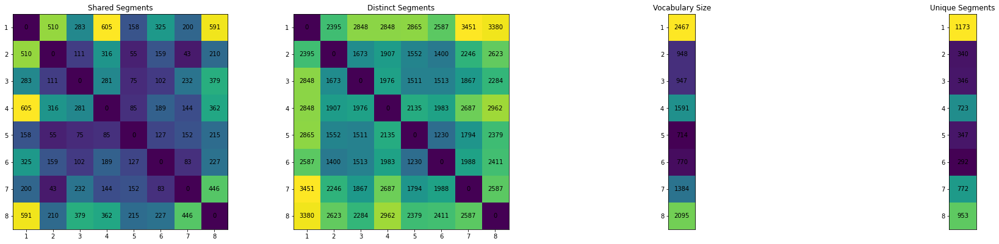

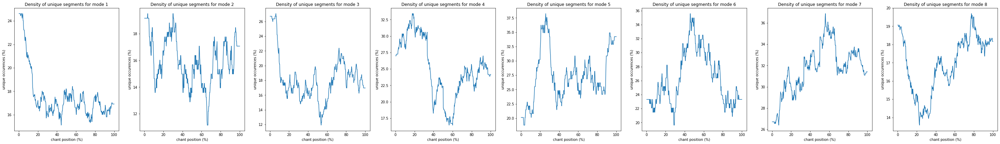

-------------------------------------------------------
--------------------------------------------------------------------------
Top selected melodies - from model: ['hgfgh', 'ghgfg', 'ghg', 'ggg', 'fedd', 'fghgf', 'fedcd', 'gfghg', 'ddcfg', 'fgh', 'fgfed', 'fghhg', 'efgfe', 'hghgf', 'hgh', 'fghg', 'fghh', 'hhgfg', 'gfghh', 'kjhgh', 'fedee', 'hgg', 'hgfgg', 'gghgf', 'kkk', 'ghfed', 'ggjkl', 'ggh', 'kjklk', 'hgefg', 'ljlml', 'fed', 'ghgff', 'kkkjh', 'kkjhg', 'ddcdf', 'ghkk', 'defgg', 'cdd', 'gfed', 'fghhh', 'kkjkl', 'ggghg', 'ghgfe', 'gfefg', 'ggk', 'hgfed', 'fgghg', 'jklml', 'hhhg', 'ghkkk', 'defg', 'kjh', 'edcdd', 'klkkj', 'klmlk', 'ggkhg', 'hkjhg', 'ggfgh', 'ddd', 'ghhgg', 'hjhgg', 'fedef', 'gfedd', 'kkkk', 'ddf', 'dcdff', 'ggggh', 'kjkhg', 'kkjhk', 'ffede', 'efg', 'ghk', 'gfede', 'lll', 'gfggh', 'hghjh', 'kkkkk', 'efggg', 'dddcf', 'ghkhg', 'hgfgf', 'efedd', 'hhkhg', 'hhhhh', 'ffgff', 'jklkh', 'hkhgg', 'ggggg', 'dfddc', 'hhg', 'gghkk', 'dcdfe', 'dfdcd', 'jkjhg', 'defed', 'hkkjh', '

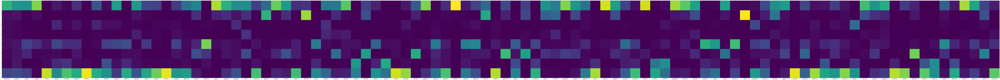



------------------------- Train + Test data charts ----------------------------
------------- Modes Vocabulary Statistics -------------


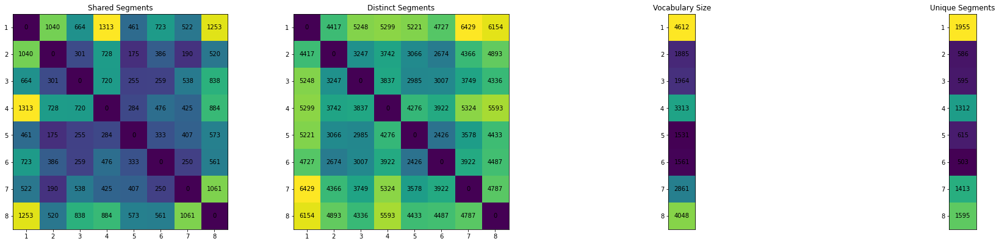

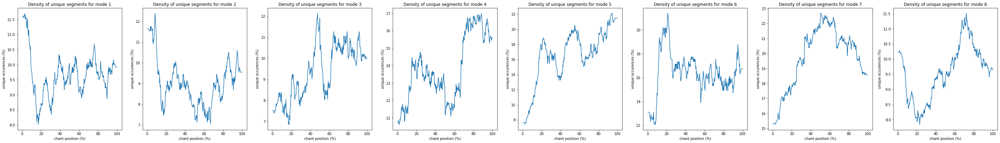

-------------------------------------------------------
------------------------------------------------------------------------


In [13]:
# Evaluate model left=0, right=5
bacor_model = evaluation_trimmed_chants(
    train_segmentation, y_train, test_segmentation, y_test, train_perplexity, test_perplexity,
    max_features_from_model = 100, include_additative = False, left_trim = 0, right_trim = 5)

------------------- Trimmed Evalution Pipeline -----------------

		 4644 train chants are too short to not to be trimmed
		 2031 test chants are too short to not to be trimmed


INFO:root:The SVC model was trained with 5062 training data and 5062 testing data.
INFO:root:From model approach - Selected features: 1000 (only 10% of them will be chosen)
INFO:root:From model approach Train data - First feature occurences: 280 , Last feature occurences: 51
INFO:root:From model approach - reduced accuracy: 95.67%, reduced f1: 95.67%


------------------------------- Train Scores -------------------------------

		 bacor accuracy and f1
			 accuracy: 95.93%
			 f1: 95.92%

		 Perplexity
			 1.067251

		 Vocabulary Size
			 size: 7247 unique segments

		 Average Segment Length
			 avgerage: 4.72 tones in one segment

		 Melody Justified With Words
			 mjww: 9.46% of segments

		 Weighted Top Mode Frequency
			 wtmf: 72.99% of melodies

		 Weighted Unique Final Pitch Count
			 wufpc: 5.52 final pitches for a chant
------------- Modes Vocabulary Statistics -------------


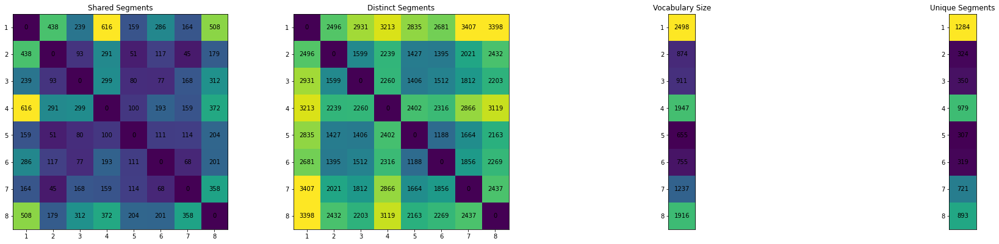

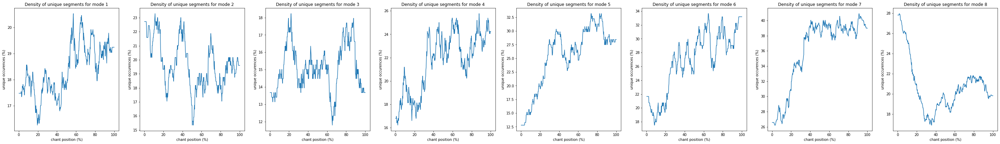

-------------------------------------------------------
--------------------------------------------------------------------------


INFO:root:The SVC model was trained with 5062 training data and 2128 testing data.
INFO:root:From model approach - Selected features: 1000 (only 10% of them will be chosen)
INFO:root:From model approach Train data - First feature occurences: 280 , Last feature occurences: 51
INFO:root:From model approach - reduced accuracy: 83.60%, reduced f1: 83.46%


------------------------------- Test Scores -------------------------------

		 bacor accuracy and f1
			 accuracy: 85.24%
			 f1: 84.98%

		 Perplexity
			 1.003323

		 Vocabulary Size
			 size: 4711 unique segments

		 Average Segment Length
			 avgerage: 4.73 tones in one segment

		 Melody Justified With Phrases
			 mjww: -100.00% of segments

		 Melody Justified With Words
			 mjww: 9.62% of segments

		 Weighted Top Mode Frequency
			 wtmf: 73.94% of melodies

		 Weighted Unique Final Pitch Count
			 wufpc: 5.71 final pitches for a chant
------------- Modes Vocabulary Statistics -------------


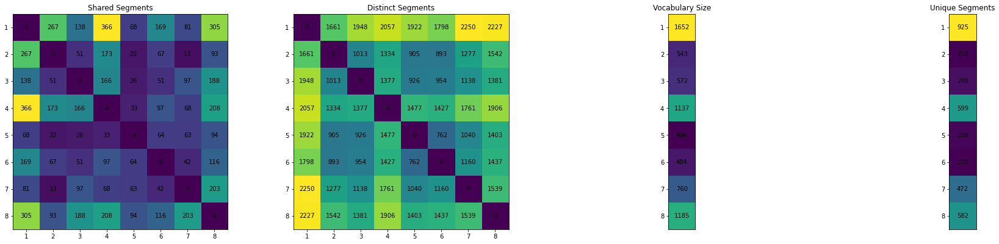

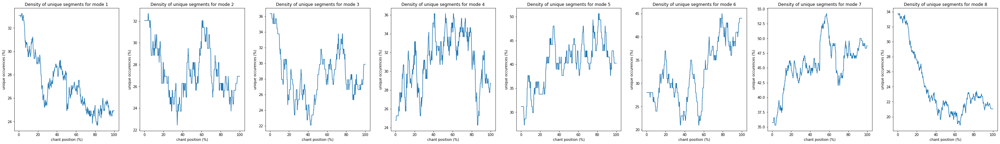

-------------------------------------------------------
--------------------------------------------------------------------------
Top selected melodies - from model: ['hgfgh', 'ghg', 'fedee', 'fedcd', 'ggg', 'ghgfg', 'ddcfg', 'fedd', 'hgh', 'fgh', 'efgfe', 'fgfed', 'fghhg', 'hgfgg', 'hhgfg', 'fghh', 'fghgf', 'hghgf', 'kjhgh', 'gfghh', 'fed', 'gfghg', 'fgghg', 'ggjkl', 'hgg', 'fghg', 'ghgff', 'cdd', 'gghgf', 'hgfed', 'kkjhg', 'ddcdf', 'ggk', 'ghgfe', 'hgefg', 'hhhg', 'ggh', 'gfed', 'ggkhg', 'gfefg', 'ghkk', 'cddhk', 'kjklk', 'ddd', 'fghhh', 'edcdd', 'ghfed', 'defgg', 'ddf', 'dfdcd', 'ffede', 'gfedd', 'fefgf', 'kkk', 'fedef', 'gfede', 'jkjhg', 'kkkjh', 'hjhgg', 'gfggh', 'hhhhh', 'ghkkk', 'kjh', 'hgfef', 'kjkhg', 'kkjkl', 'ggghg', 'ggkjk', 'efg', 'dcfgh', 'eedgh', 'defg', 'efed', 'efggg', 'hhg', 'dfddc', 'defed', 'dcdff', 'ghhgg', 'efedd', 'ccddd', 'ghk', 'dddcf', 'cdf', 'dcdd', 'feded', 'hkhgh', 'kkjhk', 'ghgfh', 'ddCfg', 'dcfg', 'dcddd', 'dcdfe', 'ggfgh', 'hhh', 'ededc', 'dedcd', 'gghg

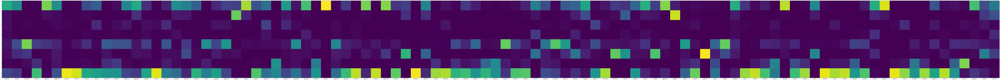



------------------------- Train + Test data charts ----------------------------
------------- Modes Vocabulary Statistics -------------


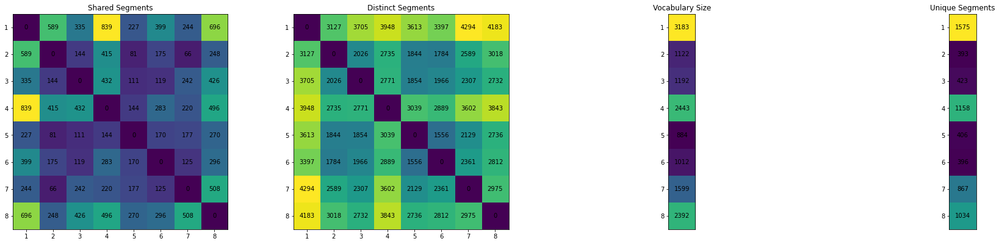

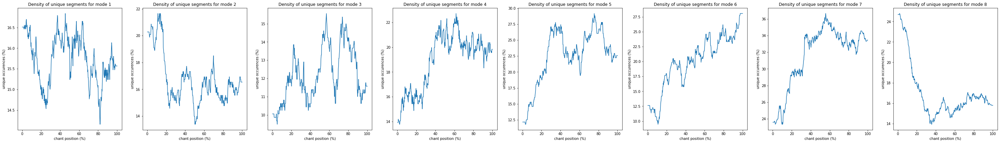

-------------------------------------------------------
------------------------------------------------------------------------


In [14]:
# Evaluate model left=0, right=10
bacor_model = evaluation_trimmed_chants(
    train_segmentation, y_train, test_segmentation, y_test, train_perplexity, test_perplexity,
    max_features_from_model = 100, include_additative = False, left_trim = 0, right_trim = 10)

------------------- Trimmed Evalution Pipeline -----------------

		 21 train chants are too short to not to be trimmed
		 7 test chants are too short to not to be trimmed


INFO:root:The SVC model was trained with 9685 training data and 9685 testing data.
INFO:root:From model approach - Selected features: 1000 (only 10% of them will be chosen)
INFO:root:From model approach Train data - First feature occurences: 1064 , Last feature occurences: 152
INFO:root:From model approach - reduced accuracy: 97.52%, reduced f1: 97.52%


------------------------------- Train Scores -------------------------------

		 bacor accuracy and f1
			 accuracy: 98.32%
			 f1: 98.32%

		 Perplexity
			 1.067251

		 Vocabulary Size
			 size: 12759 unique segments

		 Average Segment Length
			 avgerage: 4.72 tones in one segment

		 Melody Justified With Words
			 mjww: 15.36% of segments

		 Weighted Top Mode Frequency
			 wtmf: 68.94% of melodies

		 Weighted Unique Final Pitch Count
			 wufpc: 5.73 final pitches for a chant
------------- Modes Vocabulary Statistics -------------


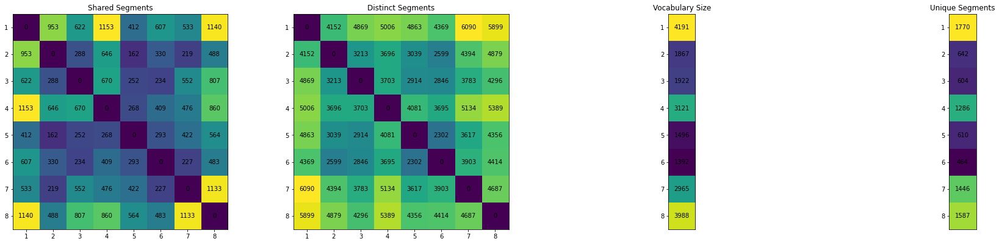

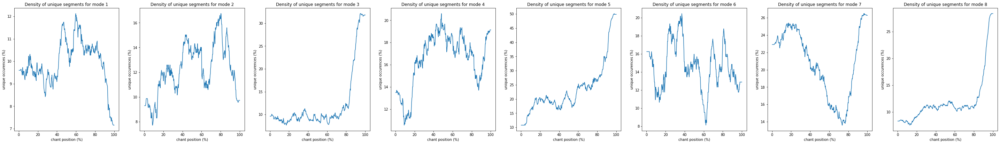

-------------------------------------------------------
--------------------------------------------------------------------------


INFO:root:The SVC model was trained with 9685 training data and 4152 testing data.
INFO:root:From model approach - Selected features: 1000 (only 10% of them will be chosen)
INFO:root:From model approach Train data - First feature occurences: 1064 , Last feature occurences: 152
INFO:root:From model approach - reduced accuracy: 89.33%, reduced f1: 89.32%


------------------------------- Test Scores -------------------------------

		 bacor accuracy and f1
			 accuracy: 90.94%
			 f1: 90.92%

		 Perplexity
			 1.003323

		 Vocabulary Size
			 size: 8441 unique segments

		 Average Segment Length
			 avgerage: 4.72 tones in one segment

		 Melody Justified With Phrases
			 mjww: -100.00% of segments

		 Melody Justified With Words
			 mjww: 14.64% of segments

		 Weighted Top Mode Frequency
			 wtmf: 69.44% of melodies

		 Weighted Unique Final Pitch Count
			 wufpc: 5.79 final pitches for a chant
------------- Modes Vocabulary Statistics -------------


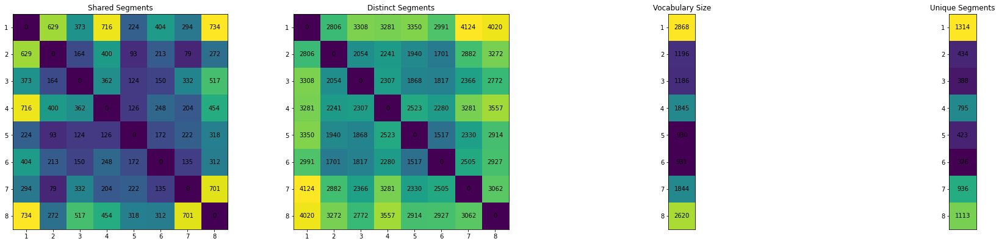

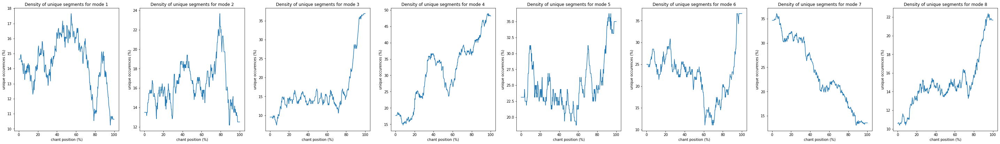

-------------------------------------------------------
--------------------------------------------------------------------------
Top selected melodies - from model: ['hgfgh', 'fedcd', 'ghgfg', 'hhgfg', 'ghg', 'efgfe', 'fedd', 'fghgf', 'gfghg', 'fgh', 'ggllm', 'fgfed', 'ggk', 'hhhg', 'hgh', 'hgg', 'hgfgg', 'fghg', 'fghhg', 'kjklk', 'ggg', 'gfghh', 'kjhgh', 'hghgf', 'kkk', 'ddhhg', 'hgefg', 'fghh', 'kjkhg', 'gghgf', 'ghgff', 'fedee', 'gfed', 'eehgh', 'fefgf', 'ghfed', 'hkjhg', 'kkkjh', 'hggk', 'ggghg', 'fed', 'hggll', 'gfefg', 'ggh', 'fghhh', 'hgfed', 'hghjh', 'ghgfe', 'hjhgg', 'jklkh', 'fedef', 'efedd', 'gfedd', 'hhhhh', 'fgghg', 'kjh', 'klmlk', 'ddcdf', 'ggfgh', 'hhg', 'edcdd', 'hgfgf', 'cdd', 'defgh', 'ffefg', 'hgfef', 'kkkk', 'ddcfg', 'klkkj', 'kkjhg', 'eddhh', 'kkkkk', 'kkjkl', 'ghhgg', 'defg', 'ghkkk', 'ghk', 'kkjhk', 'efg', 'ddf', 'feddf', 'ghgfh', 'lll', 'jkhgh', 'ffgff', 'hghkh', 'gfggh', 'ghkk', 'gfede', 'ggggh', 'jklml', 'hkkjh', 'ghjhg', 'hkhgg', 'efggg', 'dcdfe', 'dcdff', 

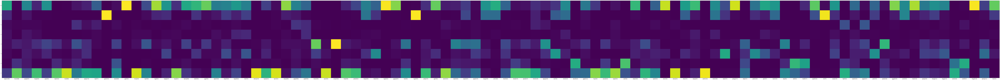



------------------------- Train + Test data charts ----------------------------
------------- Modes Vocabulary Statistics -------------


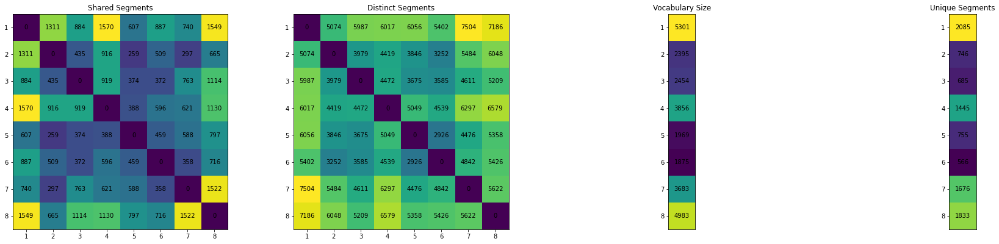

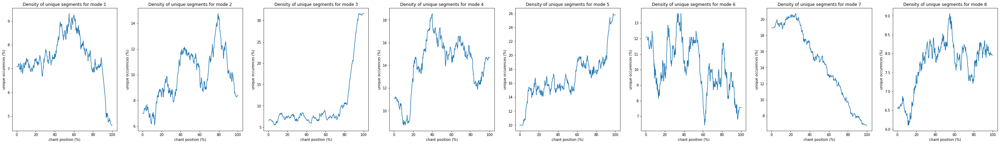

-------------------------------------------------------
------------------------------------------------------------------------


In [15]:
# Evaluate model left=1, right=1
bacor_model = evaluation_trimmed_chants(
    train_segmentation, y_train, test_segmentation, y_test, train_perplexity, test_perplexity,
    max_features_from_model = 100, include_additative = False, left_trim = 1, right_trim = 1)

------------------- Trimmed Evalution Pipeline -----------------

		 148 train chants are too short to not to be trimmed
		 57 test chants are too short to not to be trimmed


INFO:root:The SVC model was trained with 9558 training data and 9558 testing data.
INFO:root:From model approach - Selected features: 1000 (only 10% of them will be chosen)
INFO:root:From model approach Train data - First feature occurences: 739 , Last feature occurences: 119
INFO:root:From model approach - reduced accuracy: 92.62%, reduced f1: 92.59%


------------------------------- Train Scores -------------------------------

		 bacor accuracy and f1
			 accuracy: 96.76%
			 f1: 96.75%

		 Perplexity
			 1.067251

		 Vocabulary Size
			 size: 11783 unique segments

		 Average Segment Length
			 avgerage: 4.75 tones in one segment

		 Melody Justified With Words
			 mjww: 12.27% of segments

		 Weighted Top Mode Frequency
			 wtmf: 67.18% of melodies

		 Weighted Unique Final Pitch Count
			 wufpc: 5.54 final pitches for a chant
------------- Modes Vocabulary Statistics -------------


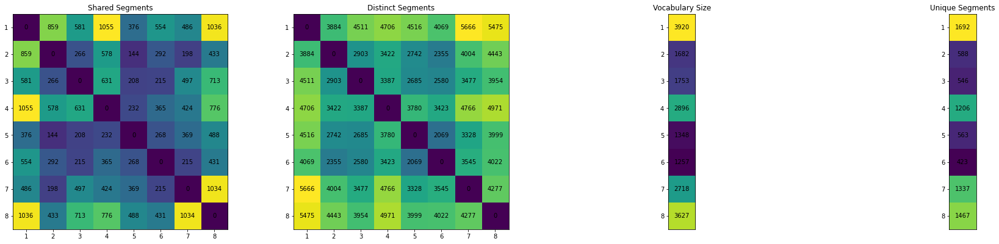

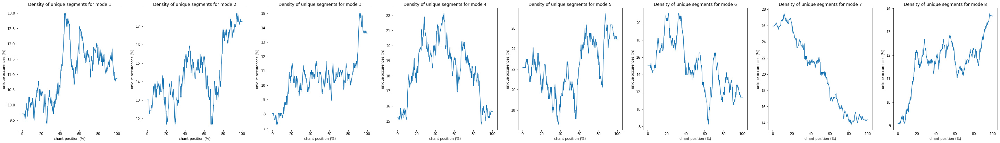

-------------------------------------------------------
--------------------------------------------------------------------------


INFO:root:The SVC model was trained with 9558 training data and 4102 testing data.
INFO:root:From model approach - Selected features: 1000 (only 10% of them will be chosen)
INFO:root:From model approach Train data - First feature occurences: 739 , Last feature occurences: 119
INFO:root:From model approach - reduced accuracy: 81.47%, reduced f1: 81.29%


------------------------------- Test Scores -------------------------------

		 bacor accuracy and f1
			 accuracy: 84.69%
			 f1: 84.53%

		 Perplexity
			 1.003323

		 Vocabulary Size
			 size: 7749 unique segments

		 Average Segment Length
			 avgerage: 4.75 tones in one segment

		 Melody Justified With Phrases
			 mjww: -100.00% of segments

		 Melody Justified With Words
			 mjww: 12.11% of segments

		 Weighted Top Mode Frequency
			 wtmf: 68.08% of melodies

		 Weighted Unique Final Pitch Count
			 wufpc: 5.63 final pitches for a chant
------------- Modes Vocabulary Statistics -------------


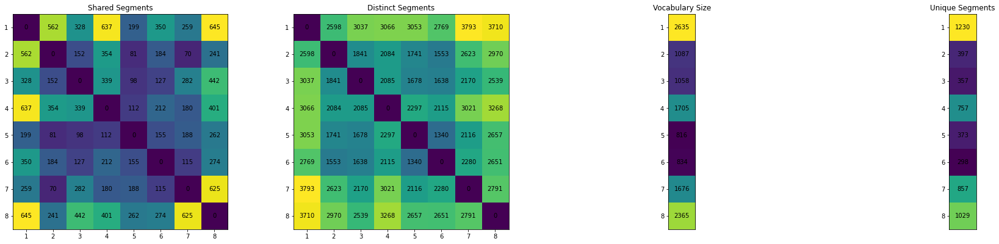

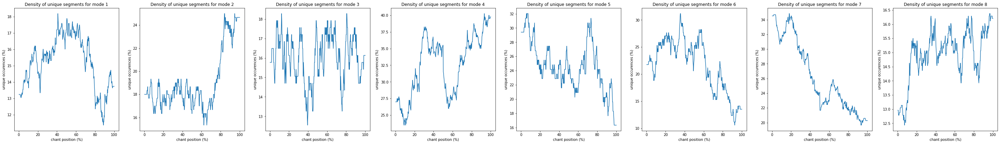

-------------------------------------------------------
--------------------------------------------------------------------------
Top selected melodies - from model: ['hgfgh', 'ghgfg', 'fedcd', 'fedd', 'efgfe', 'ghg', 'fghgf', 'fgfed', 'gfghg', 'hgfgg', 'fgh', 'hgg', 'hhgfg', 'kjhgh', 'kjklk', 'fghg', 'ggg', 'hgh', 'fghhg', 'hgefg', 'hghgf', 'gghgf', 'ghgff', 'fedee', 'fefgf', 'ghfed', 'hkjhg', 'fghh', 'gfghh', 'gfed', 'ghgfe', 'kjkhg', 'fed', 'hjhgg', 'hgfed', 'gfefg', 'jklkh', 'efedd', 'ggghg', 'fedef', 'ggh', 'gfedd', 'klmlk', 'kkk', 'fghhh', 'fgghg', 'hgfgf', 'edcdd', 'ddcdf', 'hghjh', 'ggfgh', 'kjh', 'kkkjh', 'hgfef', 'cdd', 'hhhg', 'kkjhg', 'defgh', 'ffgff', 'kkjhk', 'ffefg', 'ddcfg', 'gfede', 'hghkh', 'ghjhg', 'hkhgg', 'defg', 'gfggh', 'ghgfh', 'kkkkk', 'hkkjh', 'kkjkl', 'jklml', 'ghkhg', 'ggggh', 'dcdfe', 'efg', 'kjhjk', 'hhhhh', 'jkhgh', 'ghhgg', 'ghk', 'ghkk', 'fefgg', 'fgfff', 'hhkhg', 'ddd', 'defgg', 'efggg', 'gfedf', 'gfgg', 'kjkll', 'gfhkk', 'klkjh', 'feddf', 'hkk', 'def

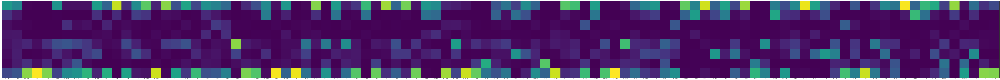



------------------------- Train + Test data charts ----------------------------
------------- Modes Vocabulary Statistics -------------


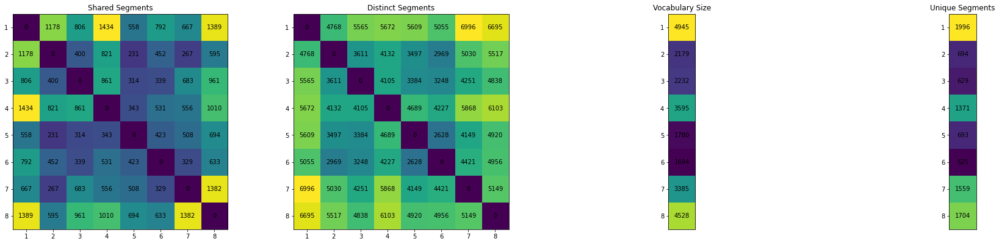

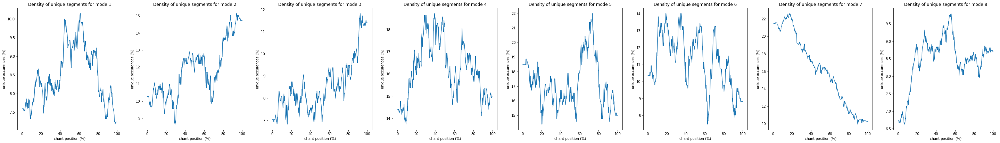

-------------------------------------------------------
------------------------------------------------------------------------


In [16]:
# Evaluate model left=2, right=2
bacor_model = evaluation_trimmed_chants(
    train_segmentation, y_train, test_segmentation, y_test, train_perplexity, test_perplexity,
    max_features_from_model = 100, include_additative = False, left_trim = 2, right_trim = 2)

------------------- Trimmed Evalution Pipeline -----------------

		 773 train chants are too short to not to be trimmed
		 319 test chants are too short to not to be trimmed


INFO:root:The SVC model was trained with 8933 training data and 8933 testing data.
INFO:root:From model approach - Selected features: 1000 (only 10% of them will be chosen)
INFO:root:From model approach Train data - First feature occurences: 490 , Last feature occurences: 91
INFO:root:From model approach - reduced accuracy: 87.84%, reduced f1: 87.78%


------------------------------- Train Scores -------------------------------

		 bacor accuracy and f1
			 accuracy: 92.93%
			 f1: 92.89%

		 Perplexity
			 1.067251

		 Vocabulary Size
			 size: 10534 unique segments

		 Average Segment Length
			 avgerage: 4.76 tones in one segment

		 Melody Justified With Words
			 mjww: 10.25% of segments

		 Weighted Top Mode Frequency
			 wtmf: 67.23% of melodies

		 Weighted Unique Final Pitch Count
			 wufpc: 5.40 final pitches for a chant
------------- Modes Vocabulary Statistics -------------


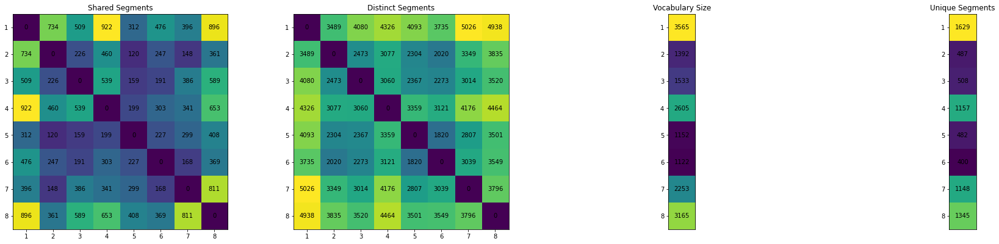

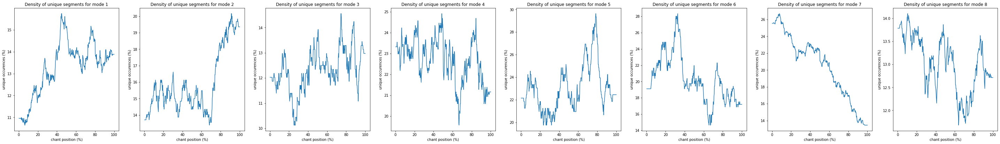

-------------------------------------------------------
--------------------------------------------------------------------------


INFO:root:The SVC model was trained with 8933 training data and 3840 testing data.
INFO:root:From model approach - Selected features: 1000 (only 10% of them will be chosen)
INFO:root:From model approach Train data - First feature occurences: 490 , Last feature occurences: 91
INFO:root:From model approach - reduced accuracy: 74.11%, reduced f1: 73.67%


------------------------------- Test Scores -------------------------------

		 bacor accuracy and f1
			 accuracy: 78.07%
			 f1: 77.65%

		 Perplexity
			 1.003323

		 Vocabulary Size
			 size: 6840 unique segments

		 Average Segment Length
			 avgerage: 4.76 tones in one segment

		 Melody Justified With Phrases
			 mjww: -100.00% of segments

		 Melody Justified With Words
			 mjww: 10.19% of segments

		 Weighted Top Mode Frequency
			 wtmf: 67.95% of melodies

		 Weighted Unique Final Pitch Count
			 wufpc: 5.52 final pitches for a chant
------------- Modes Vocabulary Statistics -------------


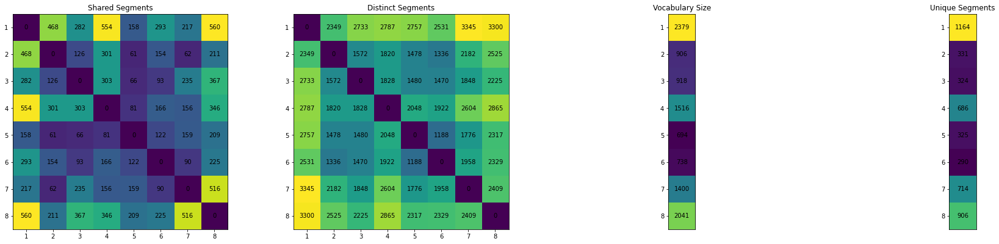

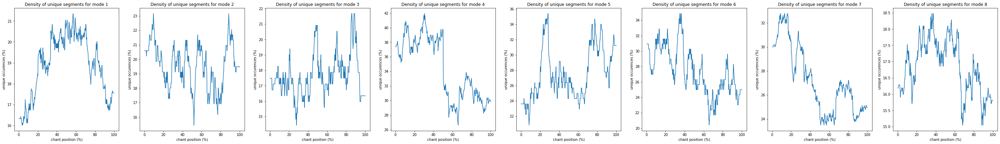

-------------------------------------------------------
--------------------------------------------------------------------------
Top selected melodies - from model: ['hgfgh', 'ghgfg', 'fedcd', 'ghg', 'fghgf', 'fedd', 'fgfed', 'efgfe', 'gfghg', 'kjhgh', 'kjklk', 'fghg', 'fgh', 'hgh', 'hgfgg', 'ghgff', 'fedee', 'hhgfg', 'gghgf', 'hgg', 'ggg', 'fghhg', 'hkjhg', 'ghfed', 'hgefg', 'fefgf', 'gfefg', 'hgfed', 'gfed', 'hjhgg', 'fedef', 'fed', 'kjkhg', 'hgfgf', 'ghgfe', 'gfghh', 'klmlk', 'ggh', 'efedd', 'fgghg', 'gfedd', 'jklkh', 'kkjhg', 'ddcdf', 'ffgff', 'ffefg', 'kkk', 'ggfgh', 'hgfef', 'edcdd', 'kkkjh', 'ggghg', 'kjh', 'gfede', 'kkkkk', 'fghh', 'hkkjh', 'cdd', 'jkjhg', 'hkhgg', 'hhhg', 'ghkhg', 'defg', 'ghgfh', 'kkjhk', 'ghjhg', 'jklml', 'gfggh', 'hghkh', 'ddcfg', 'fghhh', 'fgfff', 'fefgg', 'efggg', 'kkjkl', 'defgh', 'ghk', 'efg', 'ggfhk', 'feddd', 'ededc', 'gfedf', 'gfhkk', 'kjhgg', 'ffede', 'ghkk', 'defgg', 'ggggh', 'klkjh', 'dccdf', 'defed', 'ddd', 'kklml', 'fgf', 'kjhjk', 'kkkk', 'jkl

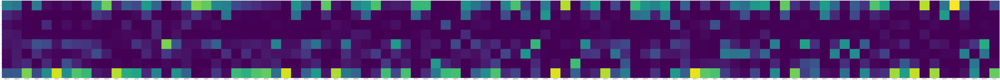



------------------------- Train + Test data charts ----------------------------
------------- Modes Vocabulary Statistics -------------


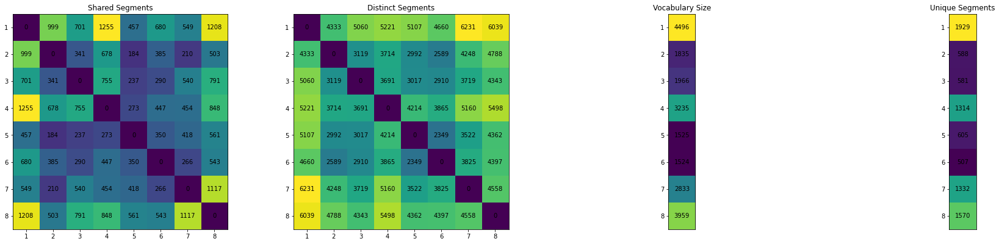

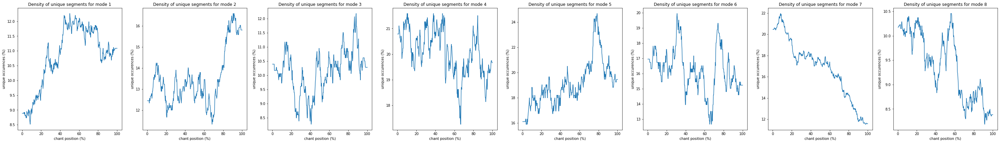

-------------------------------------------------------
------------------------------------------------------------------------


In [17]:
# Evaluate model left=3, right=3
bacor_model = evaluation_trimmed_chants(
    train_segmentation, y_train, test_segmentation, y_test, train_perplexity, test_perplexity,
    max_features_from_model = 100, include_additative = False, left_trim = 3, right_trim = 3)

------------------- Trimmed Evalution Pipeline -----------------

		 4644 train chants are too short to not to be trimmed
		 2031 test chants are too short to not to be trimmed


INFO:root:The SVC model was trained with 5062 training data and 5062 testing data.
INFO:root:From model approach - Selected features: 1000 (only 10% of them will be chosen)
INFO:root:From model approach Train data - First feature occurences: 244 , Last feature occurences: 46
INFO:root:From model approach - reduced accuracy: 88.52%, reduced f1: 88.51%


------------------------------- Train Scores -------------------------------

		 bacor accuracy and f1
			 accuracy: 92.59%
			 f1: 92.56%

		 Perplexity
			 1.067251

		 Vocabulary Size
			 size: 7778 unique segments

		 Average Segment Length
			 avgerage: 4.77 tones in one segment

		 Melody Justified With Words
			 mjww: 9.30% of segments

		 Weighted Top Mode Frequency
			 wtmf: 69.66% of melodies

		 Weighted Unique Final Pitch Count
			 wufpc: 5.59 final pitches for a chant
------------- Modes Vocabulary Statistics -------------


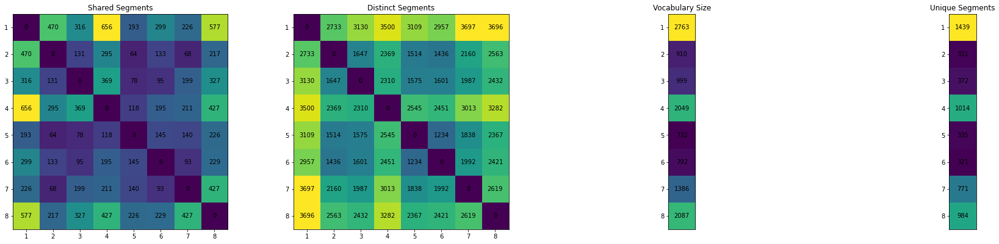

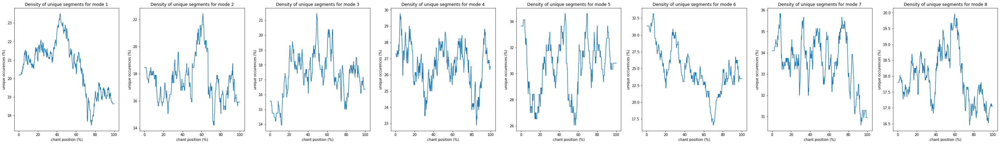

-------------------------------------------------------
--------------------------------------------------------------------------


INFO:root:The SVC model was trained with 5062 training data and 2128 testing data.
INFO:root:From model approach - Selected features: 1000 (only 10% of them will be chosen)
INFO:root:From model approach Train data - First feature occurences: 244 , Last feature occurences: 46
INFO:root:From model approach - reduced accuracy: 70.02%, reduced f1: 69.57%


------------------------------- Test Scores -------------------------------

		 bacor accuracy and f1
			 accuracy: 72.98%
			 f1: 72.42%

		 Perplexity
			 1.003323

		 Vocabulary Size
			 size: 4946 unique segments

		 Average Segment Length
			 avgerage: 4.77 tones in one segment

		 Melody Justified With Phrases
			 mjww: -100.00% of segments

		 Melody Justified With Words
			 mjww: 9.52% of segments

		 Weighted Top Mode Frequency
			 wtmf: 70.89% of melodies

		 Weighted Unique Final Pitch Count
			 wufpc: 5.81 final pitches for a chant
------------- Modes Vocabulary Statistics -------------


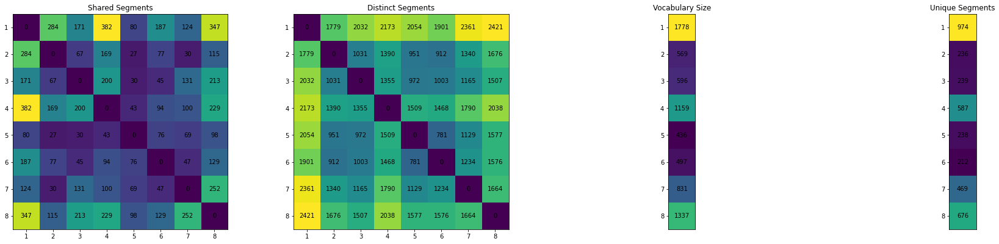

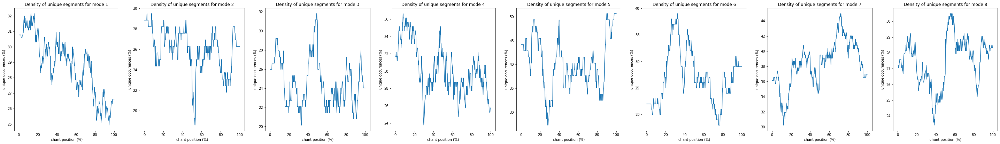

-------------------------------------------------------
--------------------------------------------------------------------------
Top selected melodies - from model: ['fedcd', 'hgfgh', 'ghg', 'fgfed', 'fedee', 'kjhgh', 'fghgf', 'fedd', 'gfghg', 'efgfe', 'hhgfg', 'hgh', 'fghg', 'hgfgg', 'gghgf', 'ggg', 'kjklk', 'hgfed', 'ghfed', 'ghgff', 'fghhg', 'gfed', 'ghgfe', 'fefgf', 'fed', 'fgh', 'hgg', 'fgghg', 'gfede', 'edcdd', 'hjhgg', 'ggh', 'ffgff', 'fedef', 'ddcfg', 'gfedd', 'hhhg', 'hgefg', 'hgfgf', 'gfefg', 'efedd', 'hkjhg', 'jkjhg', 'cdd', 'klmlk', 'hkhgg', 'kkjhg', 'ddcdf', 'fghh', 'kkkjh', 'ggghg', 'kjkhg', 'gfggh', 'hgfee', 'hgfef', 'defg', 'kkjhk', 'ffede', 'dccdf', 'efed', 'feded', 'hghkh', 'klkjh', 'ghjhg', 'kjh', 'ddd', 'defed', 'kkjkl', 'jklkj', 'hghjh', 'efggg', 'feddd', 'kjkll', 'fghhh', 'klkkj', 'gffed', 'hkkjh', 'efg', 'lmlkj', 'mlkjh', 'gfedf', 'jkhgh', 'dcdff', 'fghgh', 'gfee', 'ghkhg', 'hhg', 'ghkk', 'hklkj', 'ggggh', 'ghgfh', 'kkk', 'defgg', 'ghk', 'efedc', 'ddf', 'hkhhg'

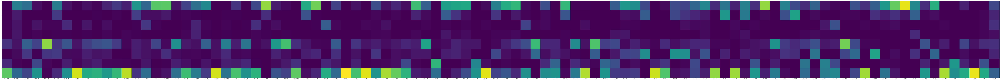



------------------------- Train + Test data charts ----------------------------
------------- Modes Vocabulary Statistics -------------


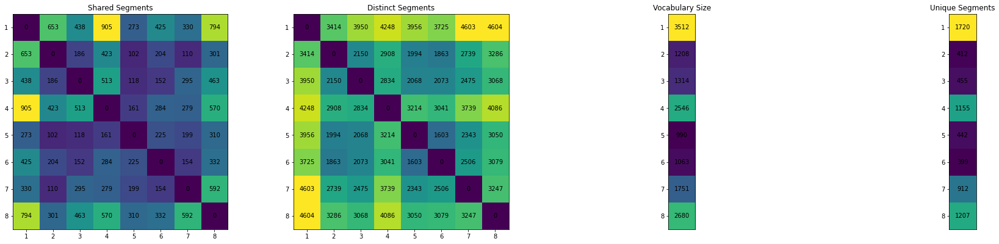

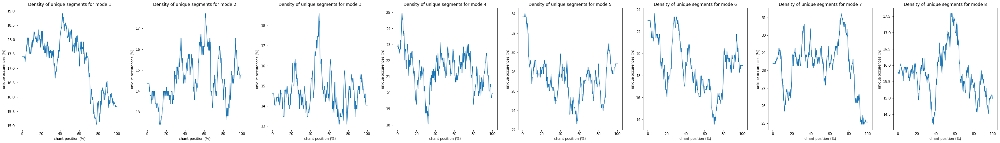

-------------------------------------------------------
------------------------------------------------------------------------


In [18]:
# Evaluate model left=5, right=5
bacor_model = evaluation_trimmed_chants(
    train_segmentation, y_train, test_segmentation, y_test, train_perplexity, test_perplexity,
    max_features_from_model = 100, include_additative = False, left_trim = 5, right_trim = 5)

------------------- Trimmed Evalution Pipeline -----------------

		 0 train chants are too short to not to be trimmed
		 0 test chants are too short to not to be trimmed


INFO:root:The SVC model was trained with 9706 training data and 9706 testing data.
INFO:root:From model approach - Selected features: 1000 (only 10% of them will be chosen)
INFO:root:From model approach Train data - First feature occurences: 1789 , Last feature occurences: 186
INFO:root:From model approach - reduced accuracy: 99.03%, reduced f1: 99.03%


------------------------------- Train Scores -------------------------------

		 bacor accuracy and f1
			 accuracy: 99.03%
			 f1: 99.03%

		 Perplexity
			 1.067251

		 Vocabulary Size
			 size: 13324 unique segments

		 Average Segment Length
			 avgerage: 4.70 tones in one segment

		 Melody Justified With Words
			 mjww: 28.77% of segments

		 Weighted Top Mode Frequency
			 wtmf: 70.47% of melodies

		 Weighted Unique Final Pitch Count
			 wufpc: 5.87 final pitches for a chant
------------- Modes Vocabulary Statistics -------------


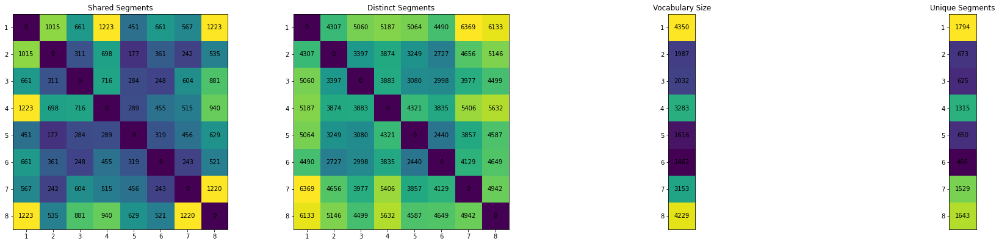

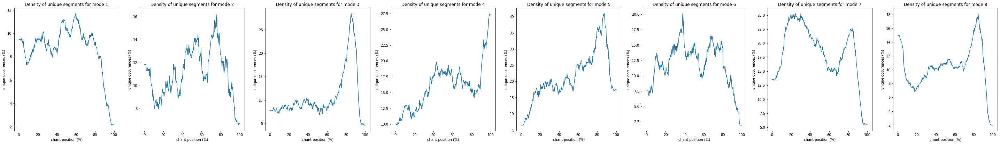

-------------------------------------------------------
--------------------------------------------------------------------------


INFO:root:The SVC model was trained with 9706 training data and 4159 testing data.
INFO:root:From model approach - Selected features: 1000 (only 10% of them will be chosen)
INFO:root:From model approach Train data - First feature occurences: 1789 , Last feature occurences: 186
INFO:root:From model approach - reduced accuracy: 93.10%, reduced f1: 93.11%


------------------------------- Test Scores -------------------------------

		 bacor accuracy and f1
			 accuracy: 93.72%
			 f1: 93.73%

		 Perplexity
			 1.003323

		 Vocabulary Size
			 size: 8921 unique segments

		 Average Segment Length
			 avgerage: 4.70 tones in one segment

		 Melody Justified With Phrases
			 mjww: -100.00% of segments

		 Melody Justified With Words
			 mjww: 16.43% of segments

		 Weighted Top Mode Frequency
			 wtmf: 70.93% of melodies

		 Weighted Unique Final Pitch Count
			 wufpc: 5.93 final pitches for a chant
------------- Modes Vocabulary Statistics -------------


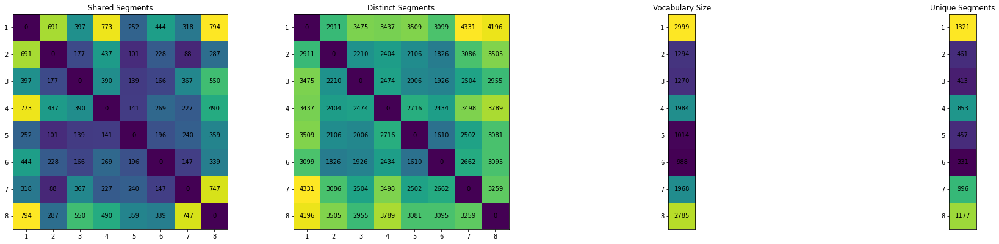

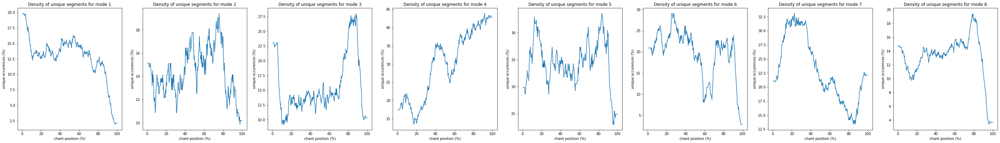

-------------------------------------------------------
--------------------------------------------------------------------------
Top selected melodies - from model: ['kjkhg', 'hgfgh', 'gfghg', 'fghgf', 'fedd', 'fghg', 'ghg', 'ghgfg', 'fedcd', 'hhgfg', 'efgfe', 'hgg', 'ggk', 'fgh', 'ggg', 'hgfgg', 'hgh', 'fghh', 'ggllm', 'fgfed', 'kkk', 'gfed', 'hhhg', 'fghhg', 'kjklk', 'hghgf', 'kjhgh', 'cdd', 'gfghh', 'ddhhg', 'fedee', 'hgefg', 'ffecd', 'ddcfg', 'mlkjh', 'gghgf', 'ghgff', 'hgfed', 'fed', 'fghhh', 'lkjh', 'kkkjh', 'fefgf', 'eehgh', 'ghfed', 'ghkk', 'ghkkk', 'hkjhg', 'ggh', 'gfedd', 'hggk', 'ggghg', 'kljkh', 'ddcdf', 'efedd', 'gfefg', 'hggll', 'hjhgg', 'fgghg', 'ghhgg', 'fedef', 'ghgfe', 'kkjhg', 'hghjh', 'kkkk', 'hhhhh', 'jklkh', 'edcdd', 'kjh', 'ggjkl', 'ljlml', 'khkjh', 'defg', 'defgg', 'khklk', 'hhg', 'ghk', 'ggfgh', 'jkhgh', 'kkjkl', 'kkkkk', 'jkjhg', 'hkhgg', 'lkjk', 'ddf', 'hgfgf', 'lll', 'gfggh', 'defgh', 'ffefg', 'jklml', 'efg', 'eddhh', 'hgfee', 'efggg', 'ddd', 'dcdff', 'dcd

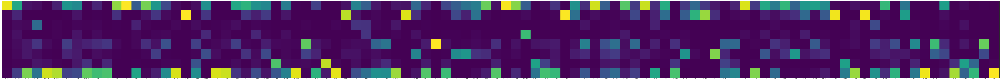



------------------------- Train + Test data charts ----------------------------
------------- Modes Vocabulary Statistics -------------


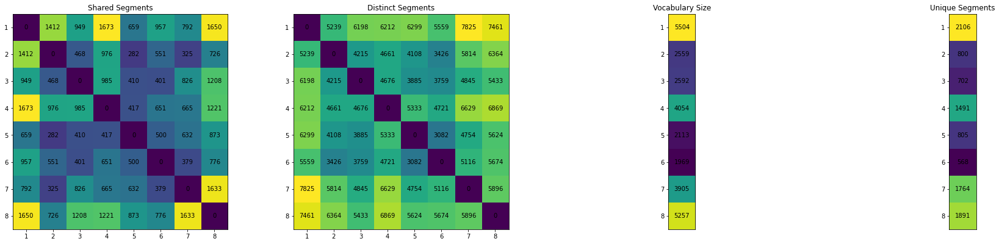

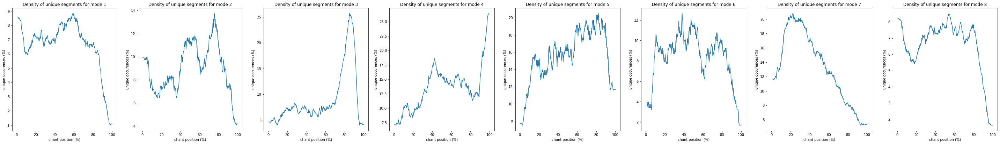

-------------------------------------------------------
------------------------------------------------------------------------


In [19]:
# Evaluate model left=0, right=0
bacor_model = evaluation_trimmed_chants(
    train_segmentation, y_train, test_segmentation, y_test, train_perplexity, test_perplexity,
    max_features_from_model = 100, include_additative = False, left_trim = 0, right_trim = 0)